In [1]:
import torch
import numpy as np
from scipy.stats import kendalltau
import pandas as pd
from matplotlib import pyplot as plt

In [2]:
ALL_STDDEVS = ["1e-05", "1.778e-05", "3.162e-05", "5.623e-05", "0.0001", "0.00017783", "0.00031623", "0.00056234", "0.001", "0.00177828", "0.00316228", "0.00562341", "0.01", "0.01778279", "0.03162278", "0.05623413", "0.1", "0.17782794", "0.31622777", "0.56234133", "1.0"]

# Query Results

In [3]:
def argmax(arr):
    arr = [(ent, idx) for idx, ent in enumerate(arr) if ent != np.nan]
    _, idx = max(arr)
    return idx

In [4]:
def get_perturbed_stats(ssl, pretrain, arch, downstream, method, downstream_task, downstream_perf):
    test_corr_filename = f"result_cache/{ssl}_{pretrain}_{arch}_{downstream}_{downstream_task}_{method}_test_corrs.pth"
    train_stddevs_filename = f"result_cache/{ssl}_{pretrain}_{arch}_{method}_train_stddevs.pth"
    test_corr = torch.load(test_corr_filename, weights_only=False)[downstream_perf]
    train_stddevs = torch.load(train_stddevs_filename, weights_only=False)
    oracle_corrs = []
    indist_train_corrs = []
    for model_num in range(10):
        test_corr_idx = argmax([sum(arr) / 5 for arr in test_corr[model_num]])
        train_stddevs_idx = argmax(train_stddevs[model_num])
        oracle_corrs.append(test_corr[model_num][test_corr_idx])
        indist_train_corrs.append(test_corr[model_num][train_stddevs_idx])
    oracle_corrs = torch.tensor(oracle_corrs)
    indist_train_corrs = torch.tensor(indist_train_corrs)
    return {
        "oracle": (oracle_corrs.mean().item(), oracle_corrs.std().item()),
        "indist_train_stddev": (indist_train_corrs.mean().item(), indist_train_corrs.std().item()),
    }

In [5]:
def get_baseline_stats(ssl, pretrain, arch, downstream, downstream_task):
    filename = f"result_cache/{ssl}_{pretrain}_{arch}_{downstream}_{downstream_task}_baseline_corrs.pth"
    results = torch.load(filename, weights_only=False)
    summarized_brier = {
        method: []
        for method in ["nc", "norm", "dist", "norm_ens", "dist_ens", "fv"]
    }
    summarized_ent = {
        method: []
        for method in ["nc", "norm", "dist", "norm_ens", "dist_ens", "fv"]
    }
    for method in ["nc", "norm", "dist", "norm_ens", "dist_ens", "fv"]:
        for model_num in range(10):
            summarized_brier[method] += results["brier"][model_num][method]
            summarized_ent[method] += results["pred_entropy"][model_num][method]
        summarized_brier[method] = torch.tensor(summarized_brier[method])
        summarized_brier[method] = (summarized_brier[method].mean().item(), summarized_brier[method].std().item())
        summarized_ent[method] = torch.tensor(summarized_ent[method])
        summarized_ent[method] = (summarized_ent[method].mean().item(), summarized_ent[method].std().item())
    return {"brier": summarized_brier , "pred_entropy": summarized_ent}

# In-Distribution Random Gauss

In [6]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, "random", "binary", "brier")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, pretrain, "binary")["brier"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_random_binary_brier.csv")

In [7]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, "random", "multi", "brier")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, pretrain, "multi")["brier"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_random_multi_brier.csv")

In [8]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, "random", "binary", "pred_entropy")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, pretrain, "binary")["pred_entropy"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_random_binary_pred_entropy.csv")

In [9]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, "random", "multi", "pred_entropy")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, pretrain, "multi")["pred_entropy"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(pretrain)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_random_multi_pred_entropy.csv")

# In-Distribution Grad Methods

In [10]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, method, "binary", "brier")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_other_binary_brier.csv")

In [11]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, method, "multi", "brier")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_other_multi_brier.csv")

In [12]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, method, "binary", "pred_entropy")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_other_binary_pred_entropy.csv")

In [13]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
for ssl in ["simclr"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, pretrain, method, "multi", "pred_entropy")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(pretrain)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/in_dist_other_multi_pred_entropy.csv")

# Transfer Learning Random Gauss

In [14]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, "random", "binary", "brier")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, downstream, "binary")["brier"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_random_binary_brier.csv")

In [15]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, "random", "multi", "brier")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, downstream, "multi")["brier"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_random_multi_brier.csv")

In [16]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, "random", "binary", "pred_entropy")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, downstream, "binary")["pred_entropy"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_random_binary_pred_entropy.csv")

In [17]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, "random", "multi", "pred_entropy")
            baseline_results = get_baseline_stats(ssl, pretrain, arch, downstream, "multi")["pred_entropy"]
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_oracle")
            full_df["mean_corr"].append(perturbed_results["oracle"][0])
            full_df["stddev_corr"].append(perturbed_results["oracle"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_tuned")
            full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
            full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
            
            full_df["ssl"].append(ssl)
            full_df["pretrain"].append(pretrain)
            full_df["arch"].append(arch)
            full_df["downstream"].append(downstream)
            full_df["method"].append("nc_baseline")
            full_df["mean_corr"].append(baseline_results["nc"][0])
            full_df["stddev_corr"].append(baseline_results["nc"][1])

            for method in ["dist", "norm", "norm_ens", "dist_ens", "fv"]:
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(method)
                full_df["mean_corr"].append(baseline_results[method][0])
                full_df["stddev_corr"].append(baseline_results[method][1])
                
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_random_multi_pred_entropy.csv")

# Transfer Learning Grad Methods

In [18]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, method, "binary", "brier")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_other_binary_brier.csv")

In [19]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, method, "multi", "brier")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_other_multi_brier.csv")

In [20]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, method, "binary", "pred_entropy")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_other_binary_pred_entropy.csv")

In [21]:
full_df = {"ssl": [], "pretrain": [], "arch": [], "method": [], "downstream": [], "mean_corr": [], "stddev_corr": []}
pretrain = "imagenet32"
for ssl in ["simclr"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            for method in ["in_space", "ortho_space", "gradinv"]:
                perturbed_results = get_perturbed_stats(ssl, pretrain, arch, downstream, method, "multi", "pred_entropy")
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_oracle_{method}")
                full_df["mean_corr"].append(perturbed_results["oracle"][0])
                full_df["stddev_corr"].append(perturbed_results["oracle"][1])
                full_df["ssl"].append(ssl)
                full_df["pretrain"].append(pretrain)
                full_df["arch"].append(arch)
                full_df["downstream"].append(downstream)
                full_df["method"].append(f"nc_tuned_{method}")
                full_df["mean_corr"].append(perturbed_results["indist_train_stddev"][0])
                full_df["stddev_corr"].append(perturbed_results["indist_train_stddev"][1])
full_df = pd.DataFrame(full_df)
full_df.to_csv("result_cache/transfer_other_multi_pred_entropy.csv")

# Images

In [22]:
SSL_TO_LATEX = {
    "simclr": "SimCLR",
    "byol": "BYOL",
    "moco": "MoCo",
}
ARCH_TO_LATEX = {
    "resnet18": "ResNet18",
    "resnet50": "ResNet50",
}
DATASET_TO_LATEX = {
    "cifar10": "CIFAR10",
    "cifar100": "CIFAR100",
    "stl10": "STL10",
    "imagenet32": "TinyImagenet",
}
METHOD_TO_LATEX = {
    "ortho_space": "$\\mathsf{PNC}_k^{\\perp}$",
    "in_space": "$\\mathsf{PNC}_k^{\\|}$",
    "gradinv": "$\\mathsf{PNC}_k^{g}$",
    "random": "$\\mathsf{PNC}_k$",
}

def get_image(ssl, pretrain, arch, downstream, method, downstream_task, downstream_perf, title, left_ylim, right_ylim, filename):
    test_corr_filename = f"result_cache/{ssl}_{pretrain}_{arch}_{downstream}_{downstream_task}_{method}_test_corrs.pth"
    train_stddevs_filename = f"result_cache/{ssl}_{pretrain}_{arch}_{method}_train_stddevs.pth"
    test_corr = torch.load(test_corr_filename, weights_only=False)[downstream_perf]
    train_stddevs = torch.load(train_stddevs_filename, weights_only=False)
    
    corrs = test_corr[0]
    for model_num in range(1, 10):
        for idx in range(len(ALL_STDDEVS)):
            corrs[idx] += test_corr[model_num][idx]
    stddevs = [[] for _ in range(len(ALL_STDDEVS))]
    for model_num in range(10):
        for idx in range(len(ALL_STDDEVS)):
            stddevs[idx].append(train_stddevs[model_num][idx].item())

    error_idx = len(ALL_STDDEVS)
    for idx in range(len(ALL_STDDEVS)):
        corrs[idx] = torch.tensor(corrs[idx])
        corrs[idx] = corrs[idx].mean().item()
        stddevs[idx] = torch.tensor(stddevs[idx])
        if stddevs[idx].isnan().any():
            error_idx = idx
            break
        stddevs[idx] = stddevs[idx].mean().item()
    
    fig, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    
    ax1.plot([float(stddev) for stddev in ALL_STDDEVS[:error_idx]], corrs[:error_idx], color="blue", label="Kendall-$\\tau$")
    ax1.set_ylabel("Kendall's $\\tau$ Coefficient", color="blue", fontsize=16)
    ax1.tick_params(axis='y', labelcolor="blue", labelsize=14)
    if error_idx != len(ALL_STDDEVS):
        ax1.plot([float(ALL_STDDEVS[error_idx-1]), float(ALL_STDDEVS[error_idx-1])], left_ylim, color="gray", linestyle='dashed')
    ax1.set_ylim(left_ylim)
    
    ax2.plot([float(stddev) for stddev in ALL_STDDEVS[:error_idx]], stddevs[:error_idx], color="red", label=f"Std. Dev. of {METHOD_TO_LATEX[method]}")
    ax2.set_ylabel(f"Standard Dev. of {METHOD_TO_LATEX[method]} Scores", color="red", fontsize=16)
    ax2.tick_params(axis='y', labelcolor="red", labelsize=14)
    ax2.set_ylim(right_ylim)
    
    plt.xscale("log")
    ax1.tick_params(axis='x', labelsize=14)
    ax1.set_xlabel("Perturbation Magnitude $\\sigma_{pert}$", fontsize=16)
    plt.grid()

    plt.xlim([7.5e-6, 2.0])
    plt.title(title, fontsize=18)
    ax1.legend(fontsize=14, loc="upper left")
    ax2.legend(fontsize=14, loc="upper right")
    plt.savefig(filename, bbox_inches="tight")
    plt.rcdefaults()

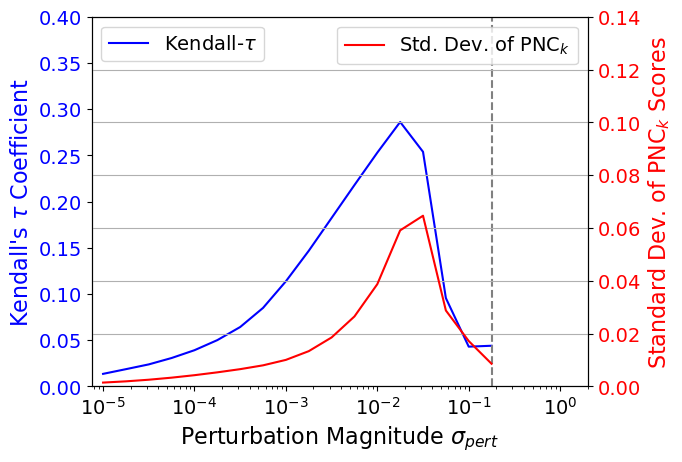

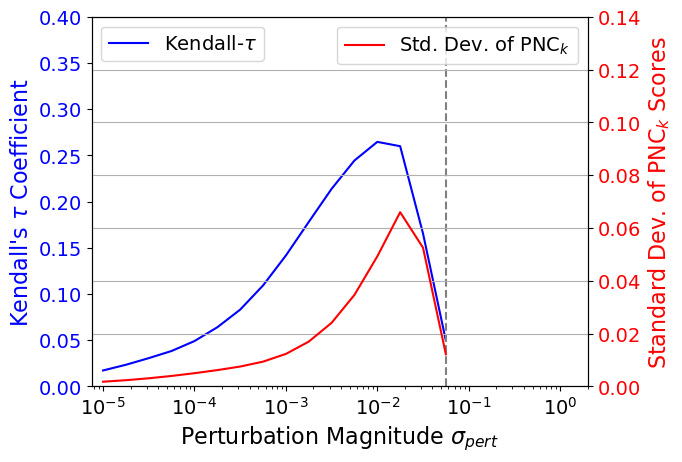

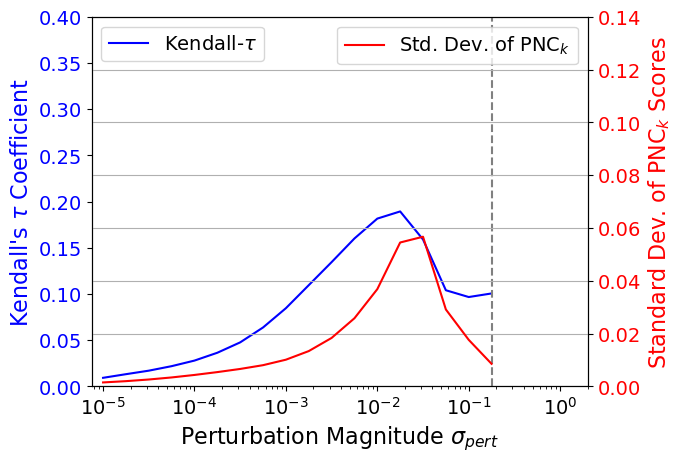

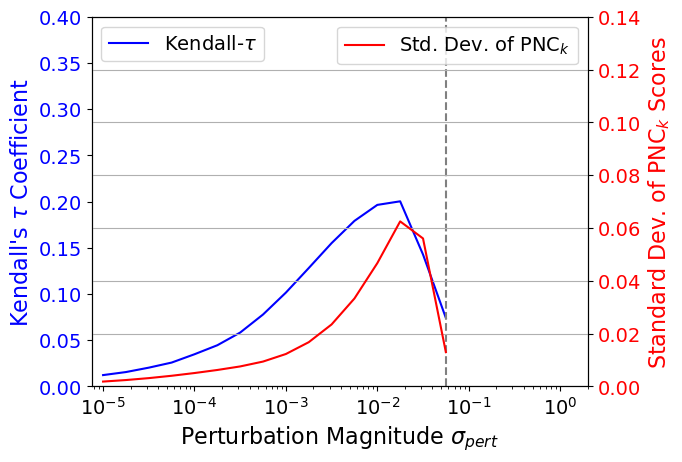

In [23]:
task = "binary"
perf = "brier"
ssl = "simclr"
for pretrain in ["cifar10", "cifar100"]:
    for arch in ["resnet18", "resnet50"]:
        get_image(ssl, pretrain, arch, pretrain, "random", task, perf, "", [0.0, 0.40], [0.0, 0.14], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_random_{task}_{perf}.jpg")

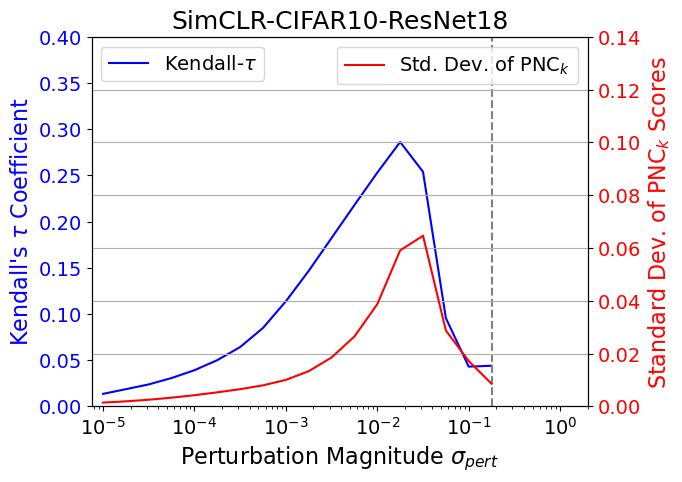

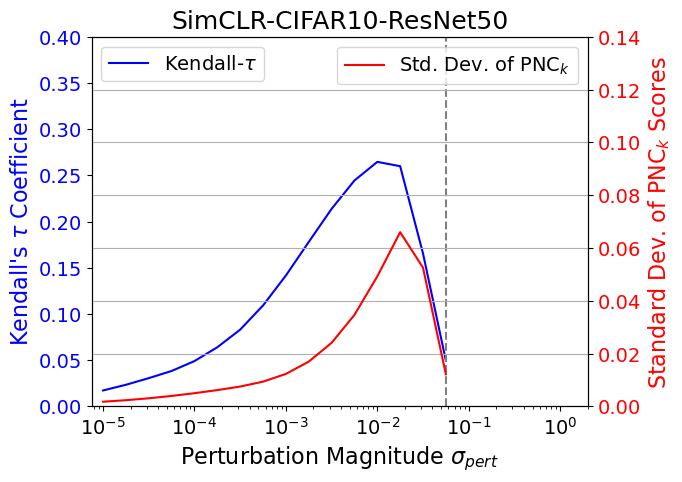

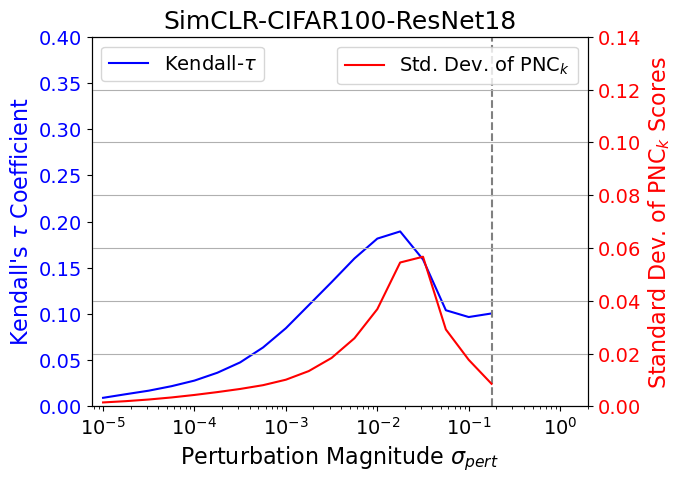

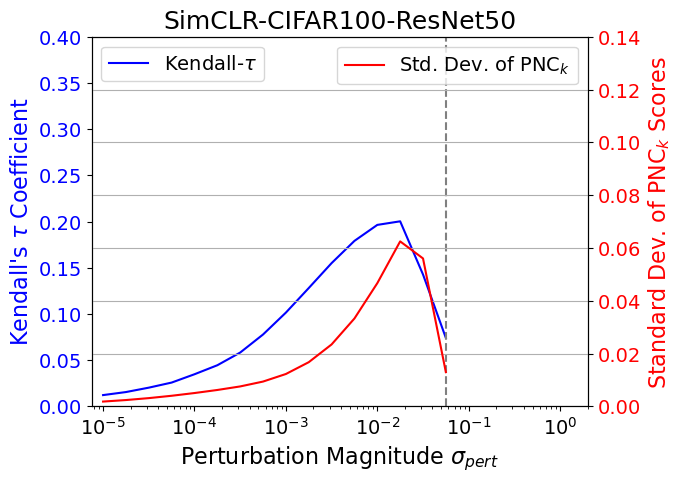

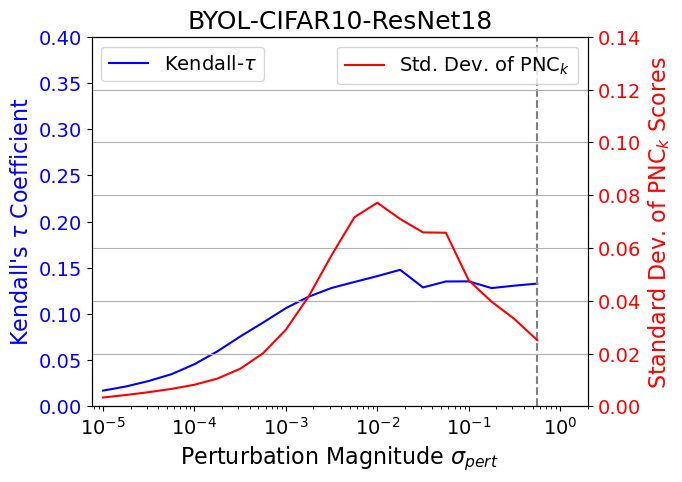

...

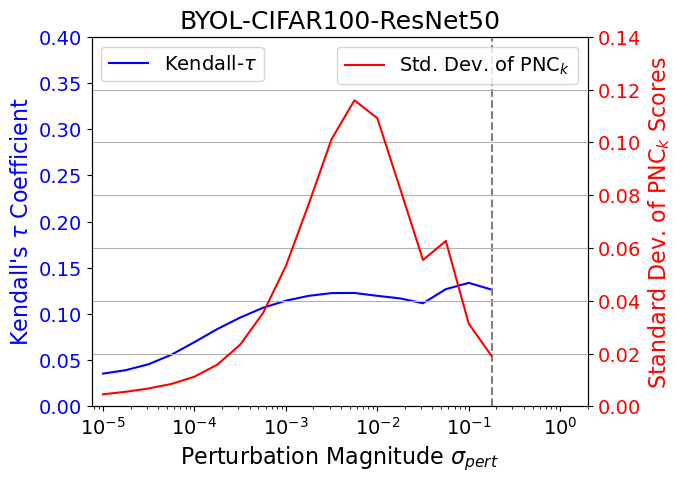

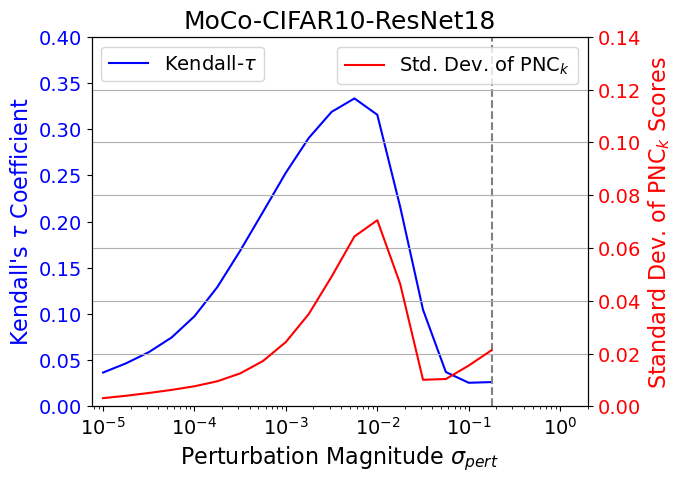

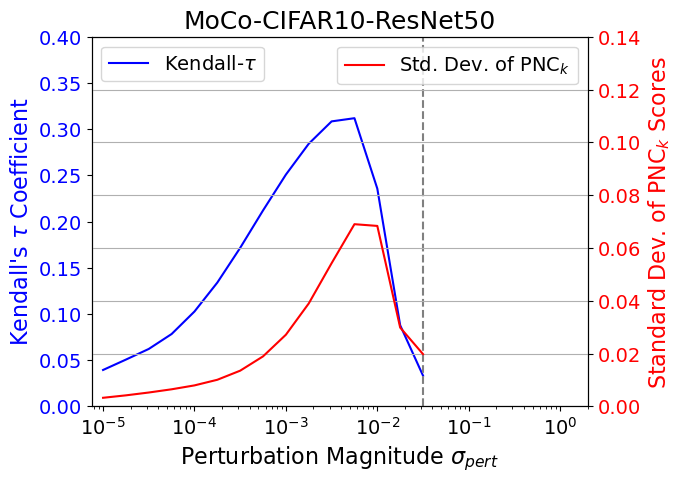

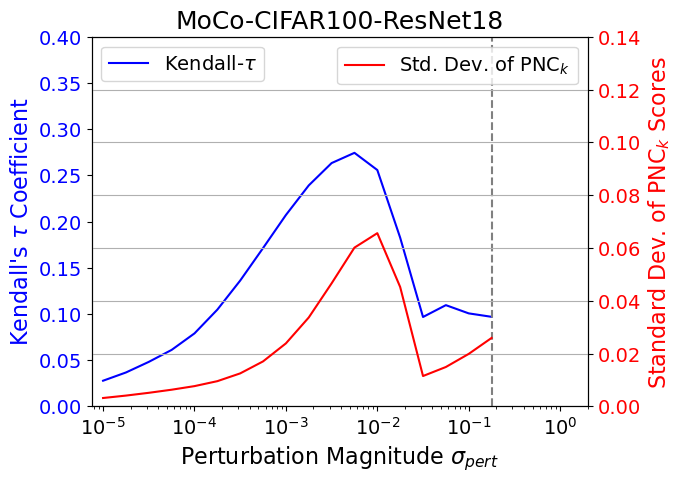

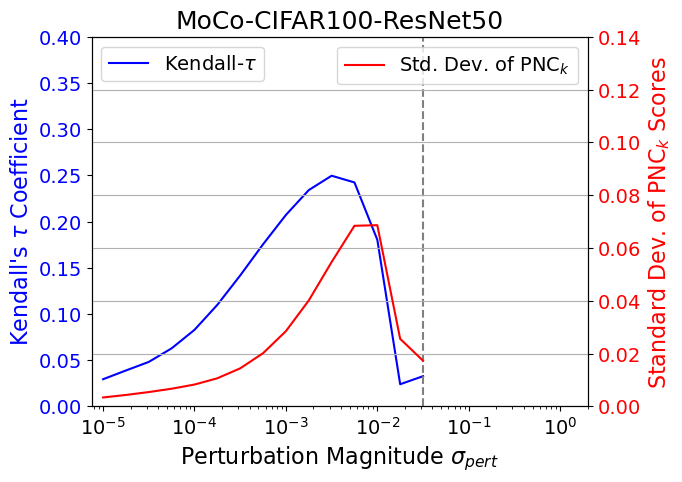

In [24]:
task = "binary"
perf = "brier"
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.40], [0.0, 0.14], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_random_{task}_{perf}.jpg")

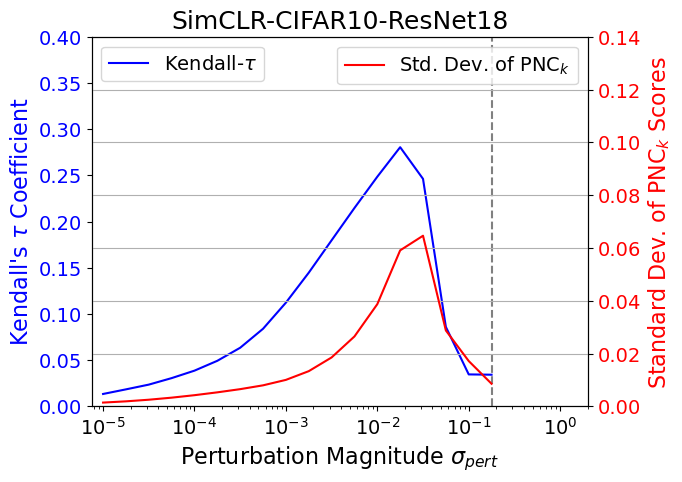

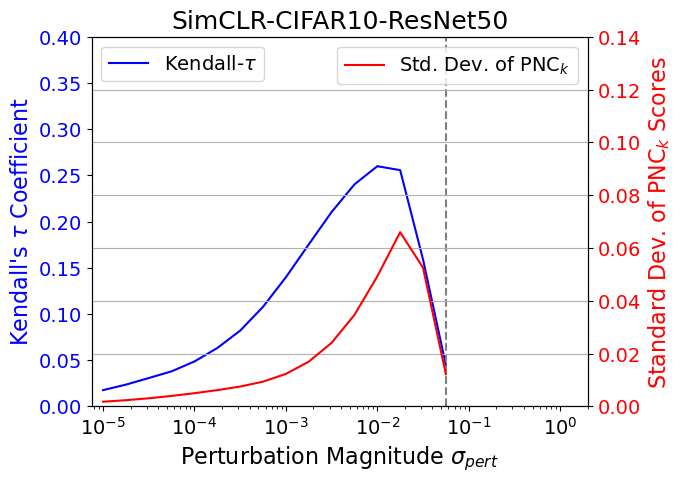

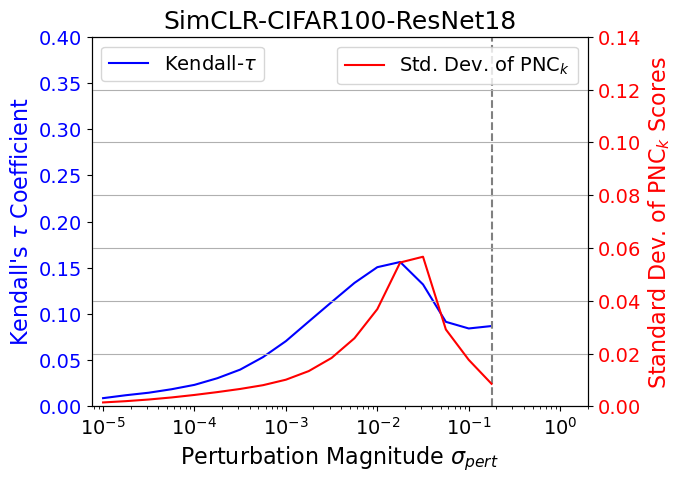

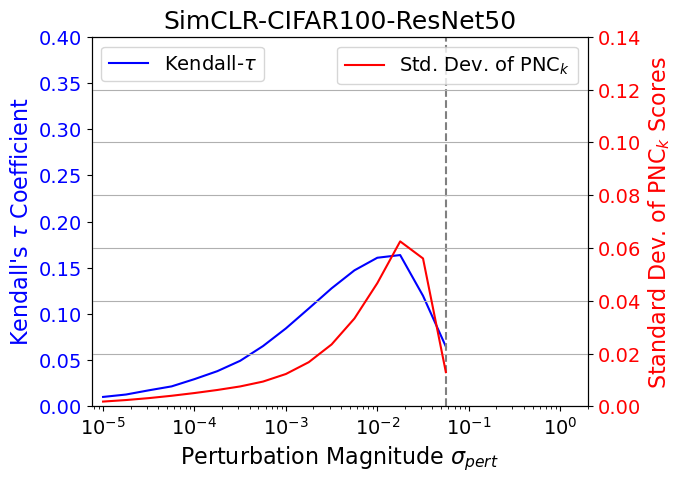

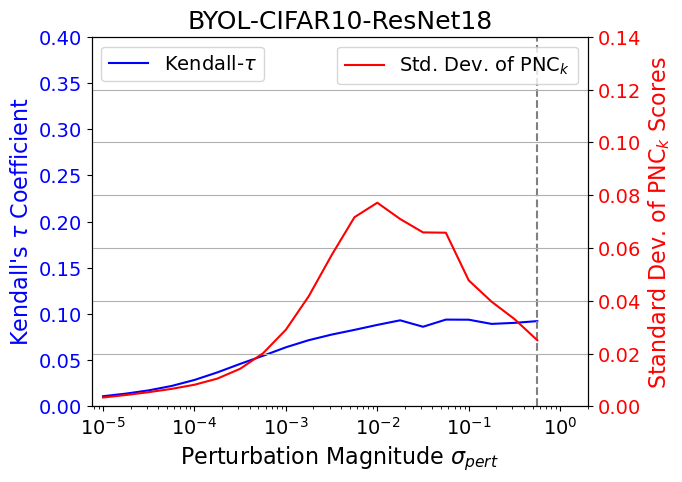

...

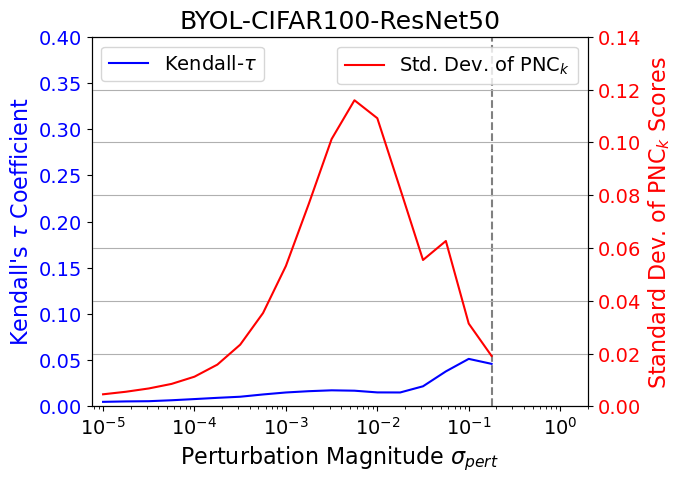

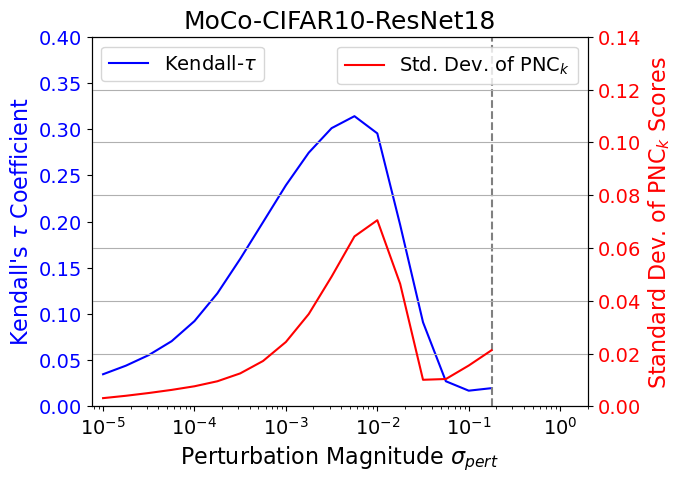

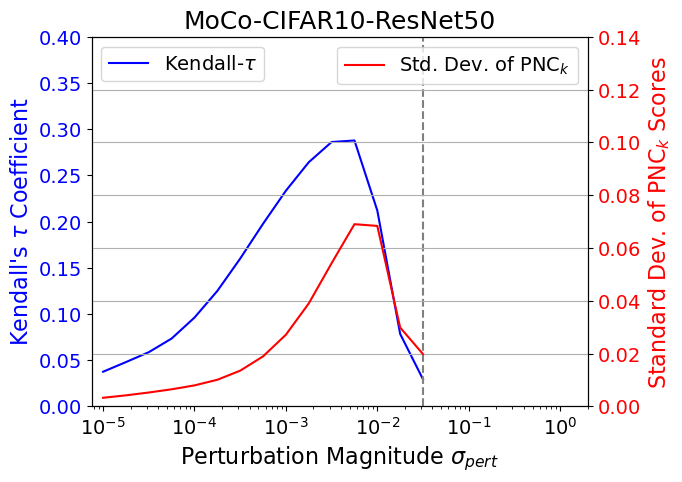

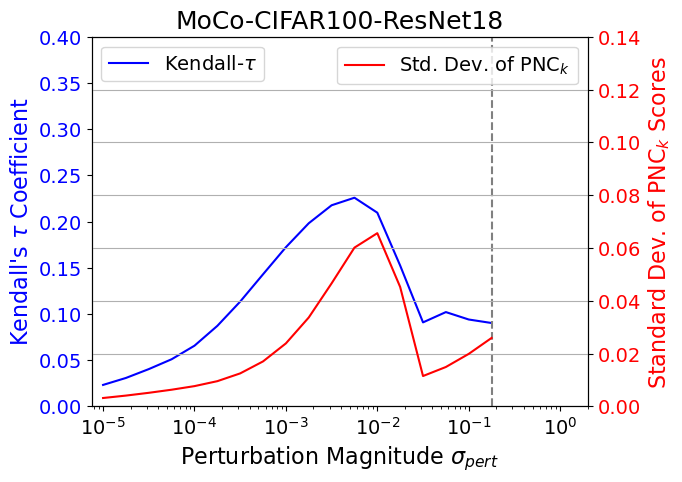

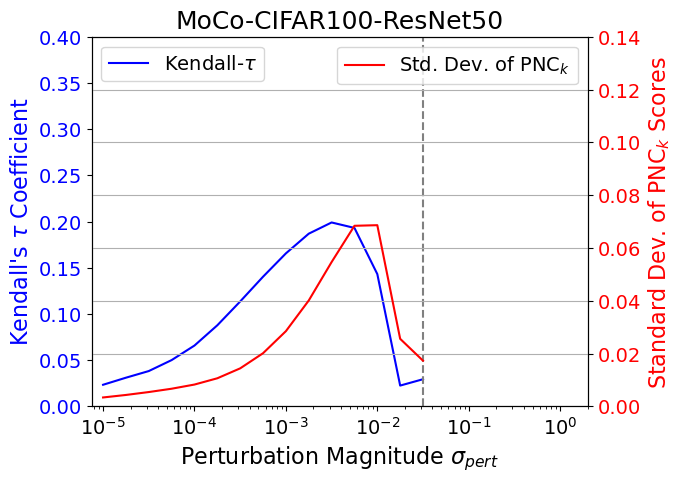

In [25]:
task = "multi"
perf = "brier"
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.40], [0.0, 0.14], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_random_{task}_{perf}.jpg")

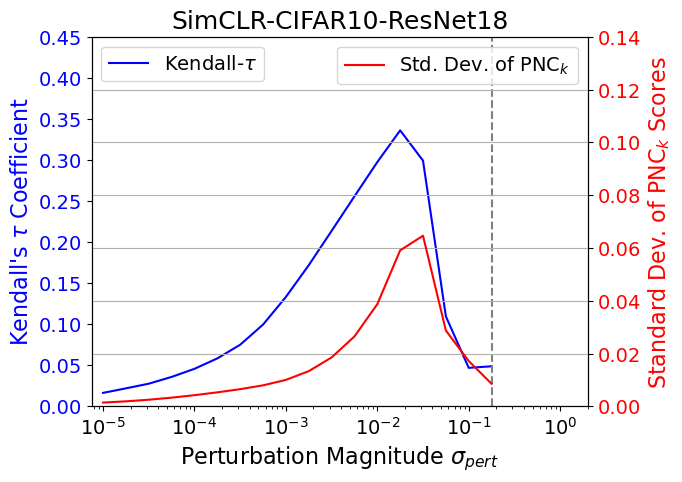

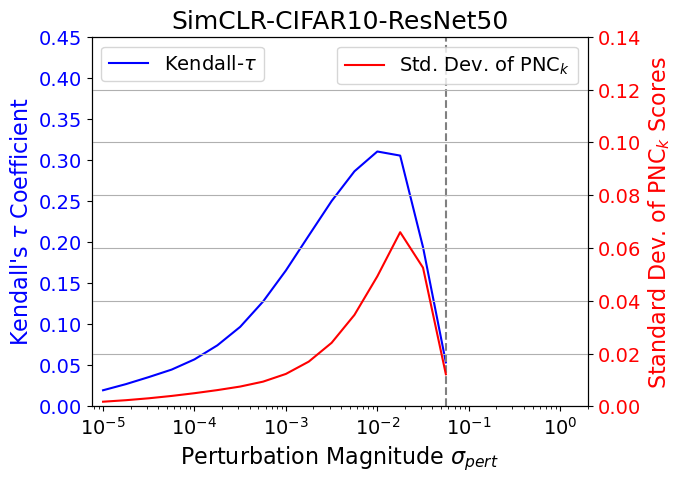

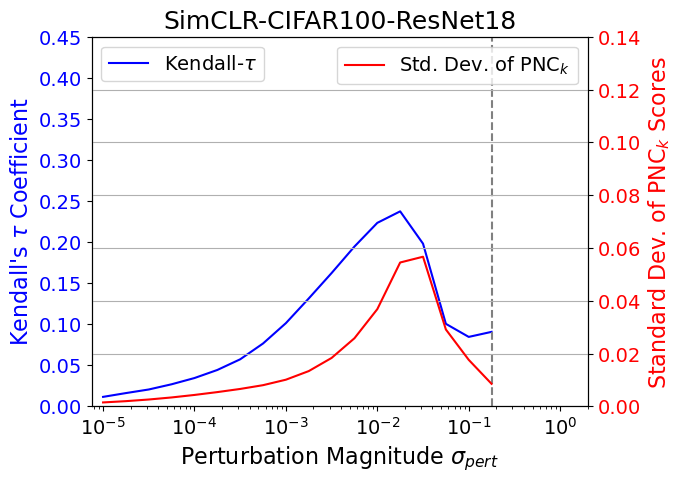

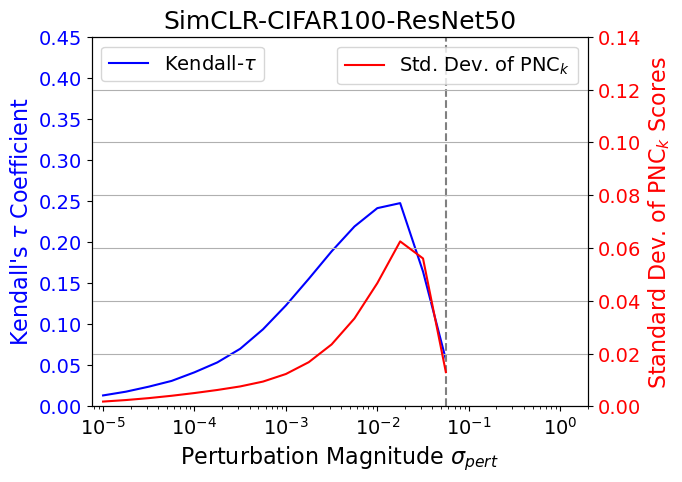

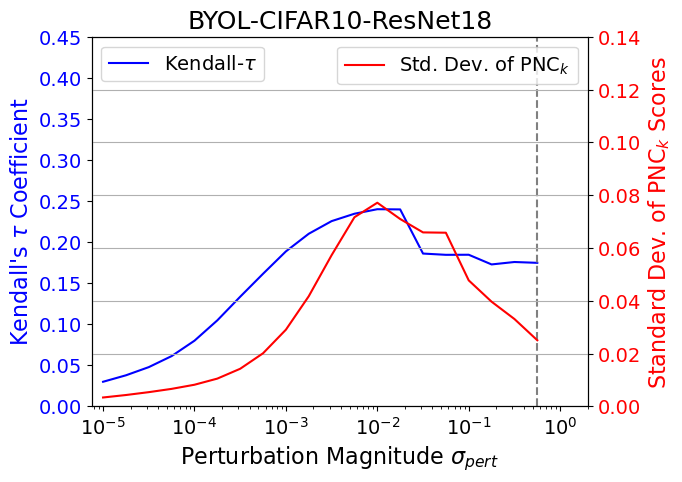

...

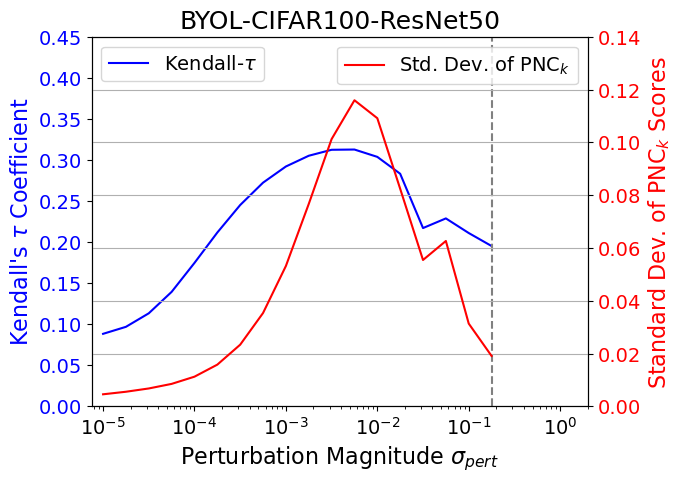

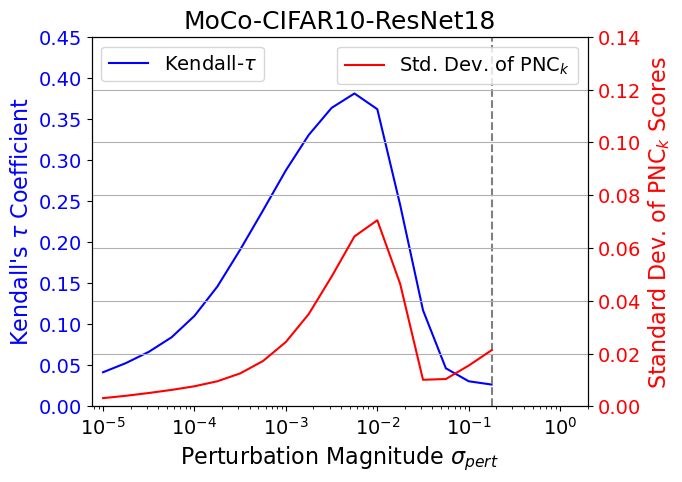

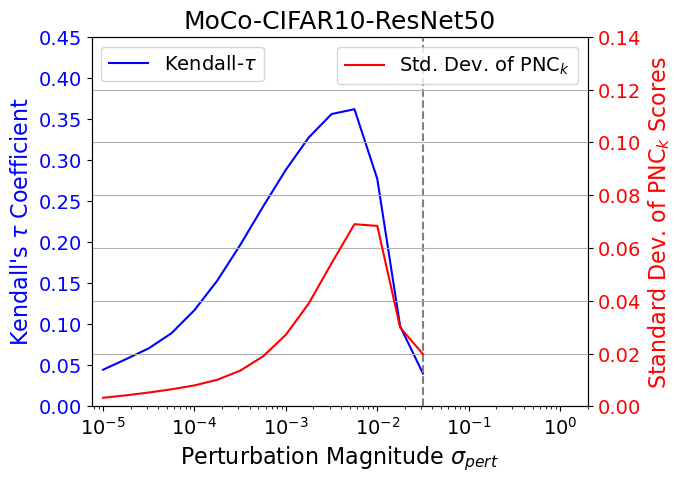

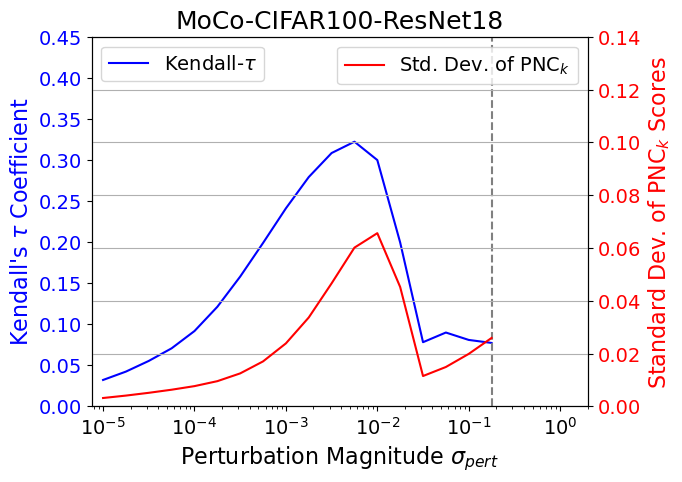

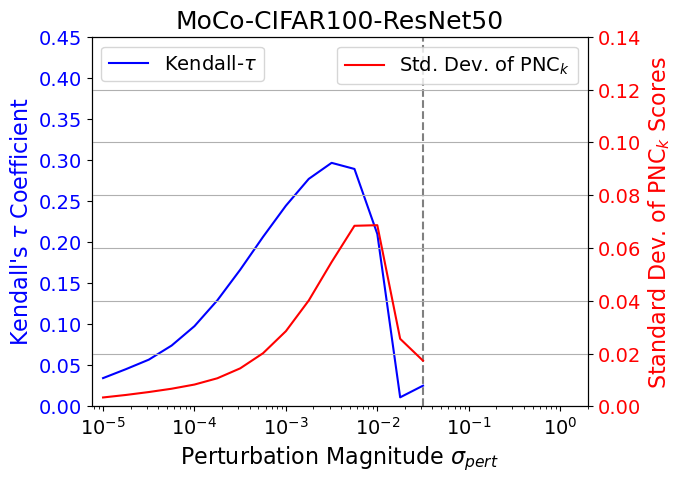

In [26]:
task = "binary"
perf = "pred_entropy"
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.45], [0.0, 0.14], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_random_{task}_{perf}.jpg")

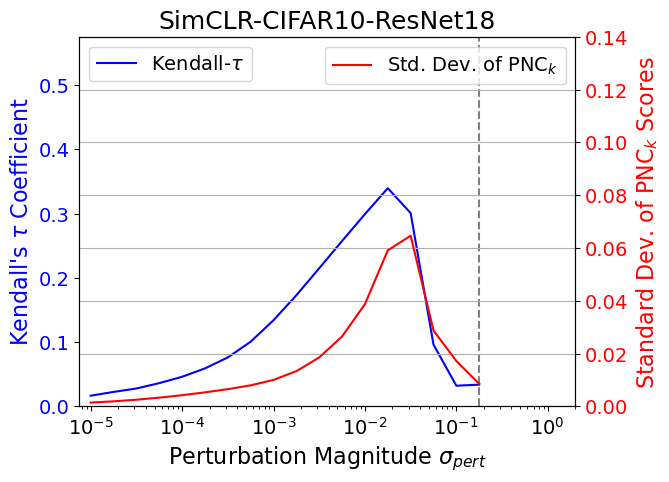

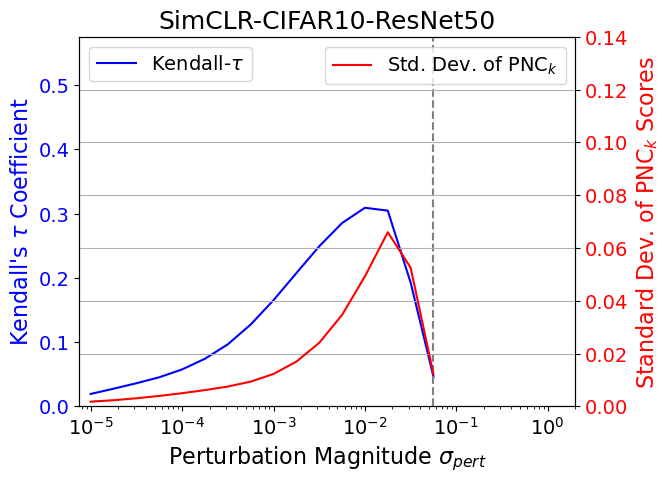

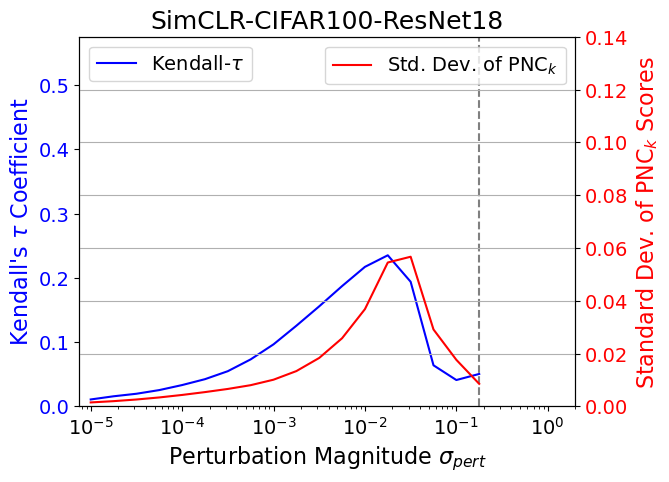

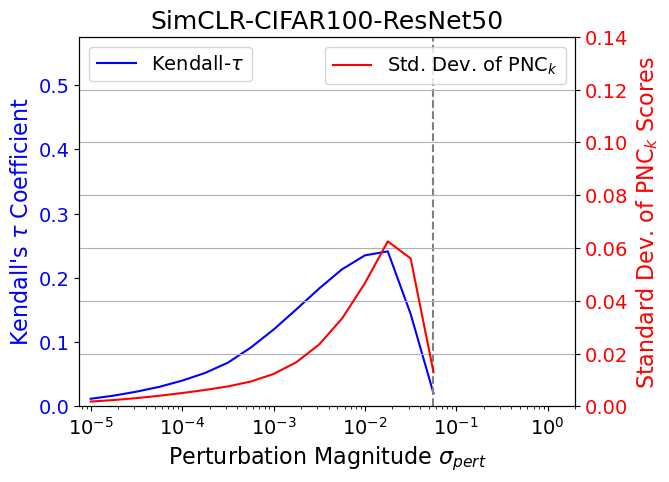

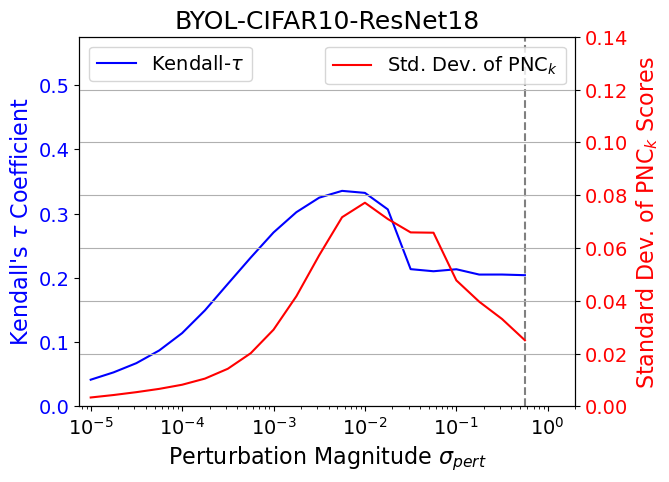

...

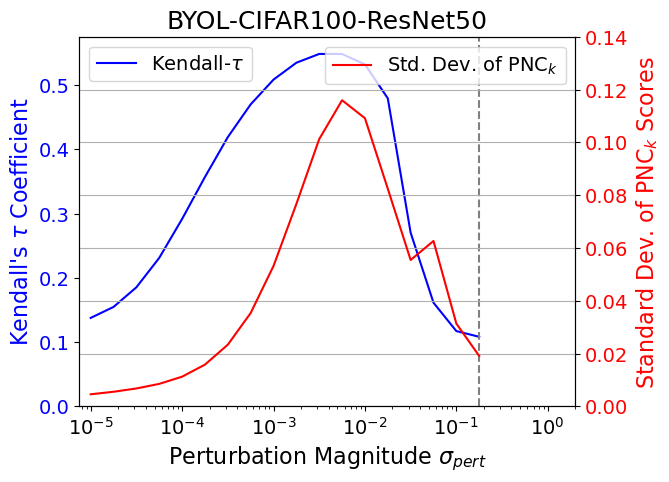

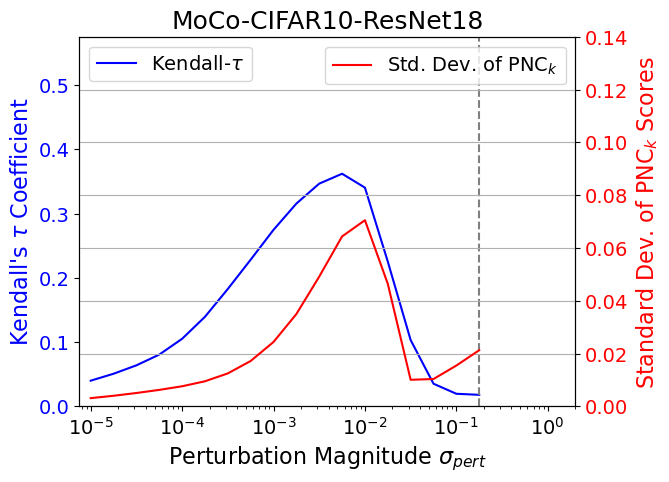

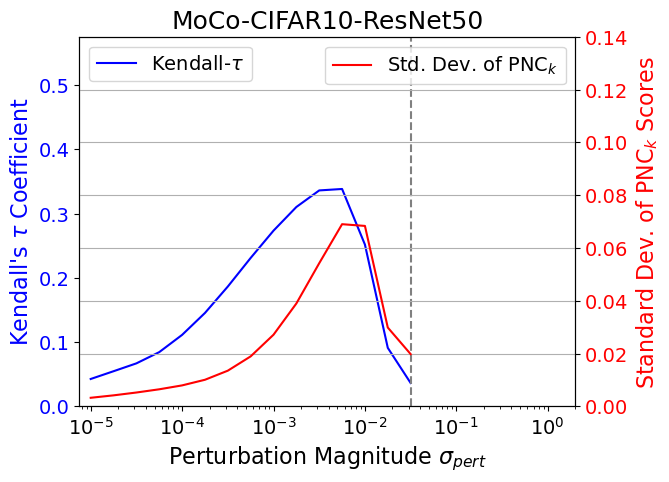

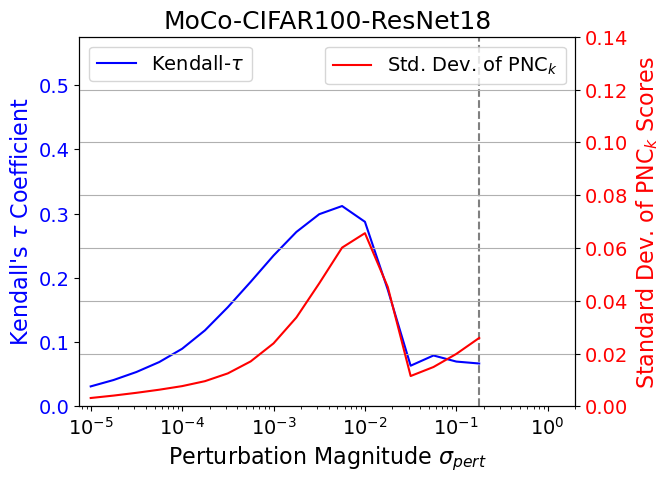

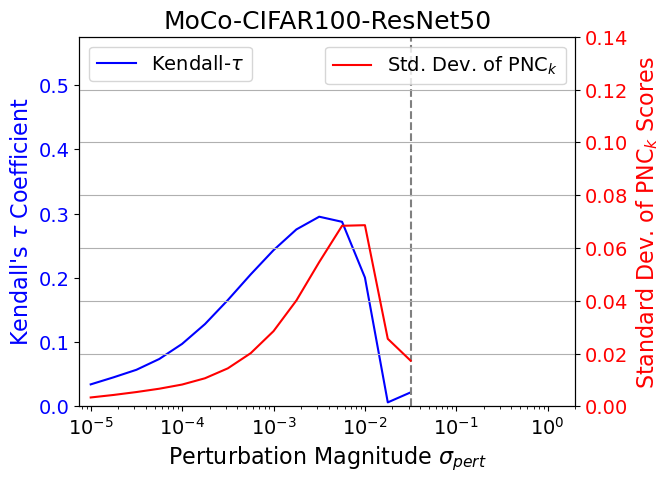

In [27]:
task = "multi"
perf = "pred_entropy"
for ssl in ["simclr", "byol", "moco"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.575], [0.0, 0.14], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_random_{task}_{perf}.jpg")

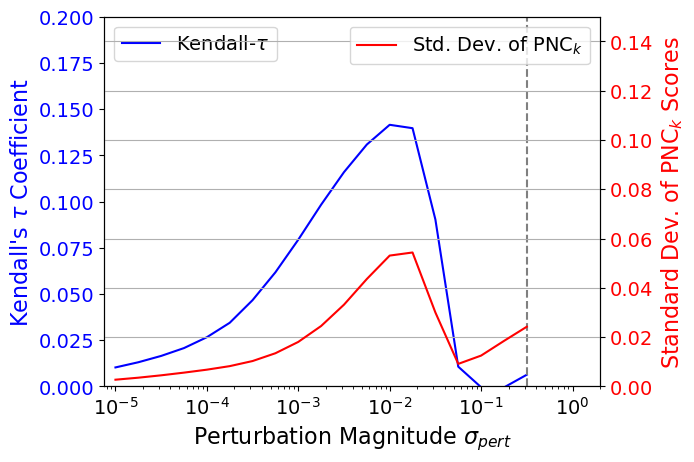

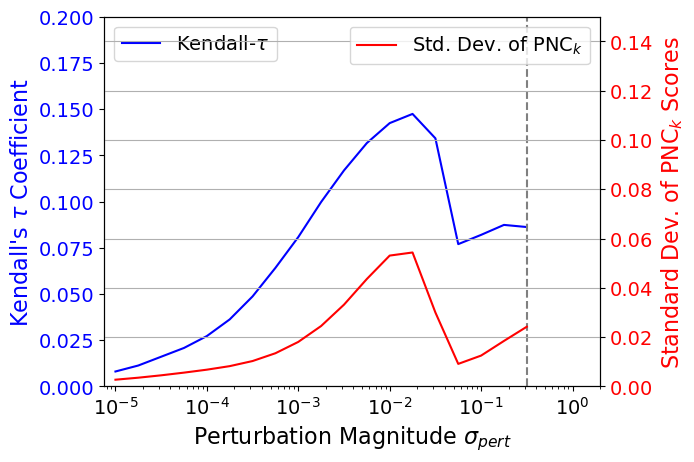

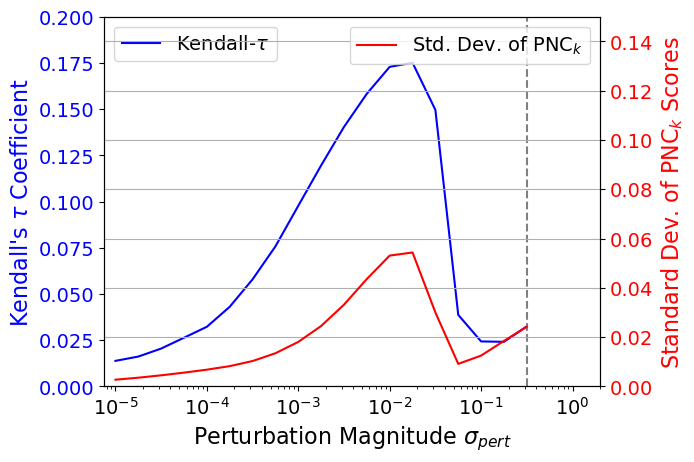

In [28]:
task = "binary"
perf = "brier"
pretrain = "imagenet32"
ssl = "simclr"
arch = "resnet18"
for downstream in ["cifar10", "cifar100", "stl10"]:
        get_image(ssl, pretrain, arch, downstream, "random", task, perf, "", [0.0, 0.20], [0.0, 0.15], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_random_{task}_{perf}_no_title.jpg")

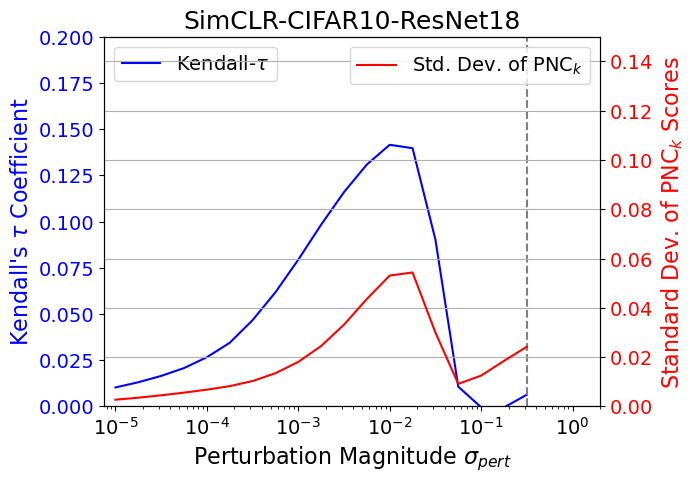

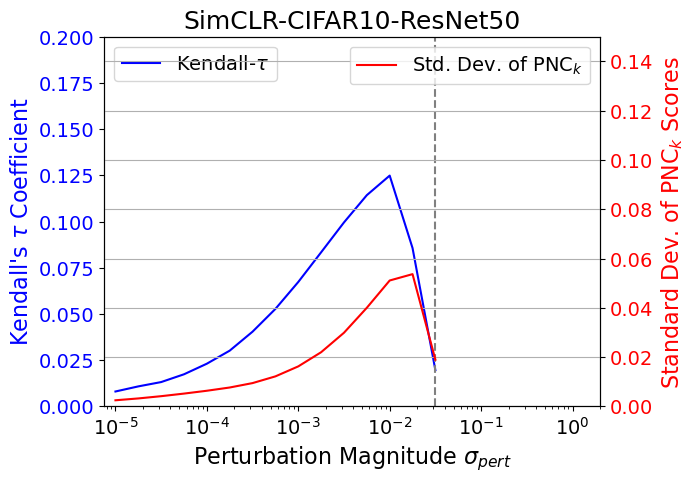

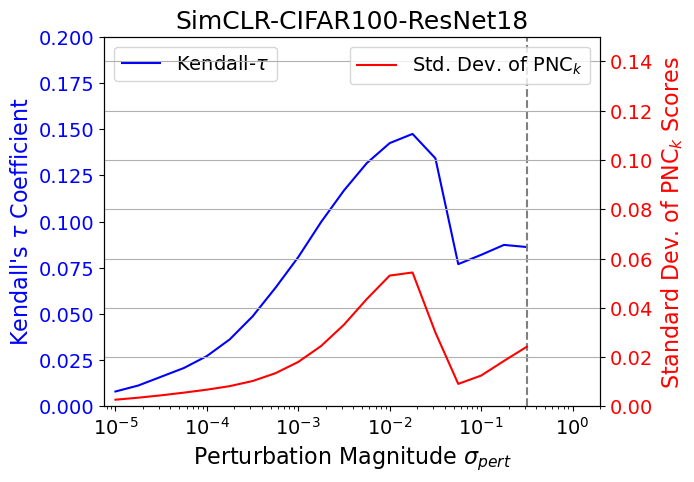

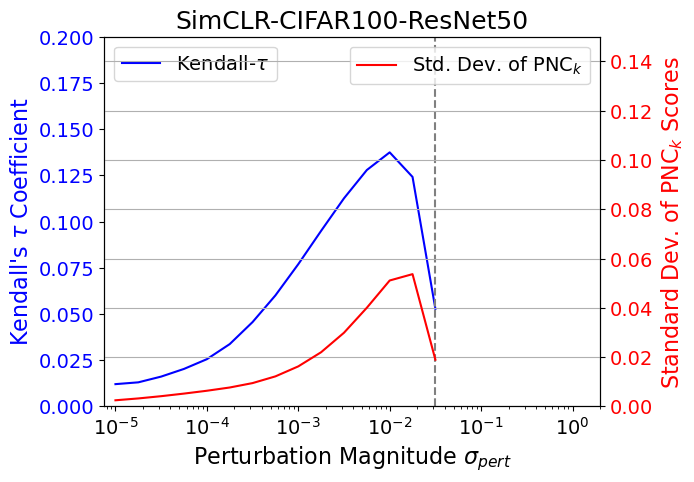

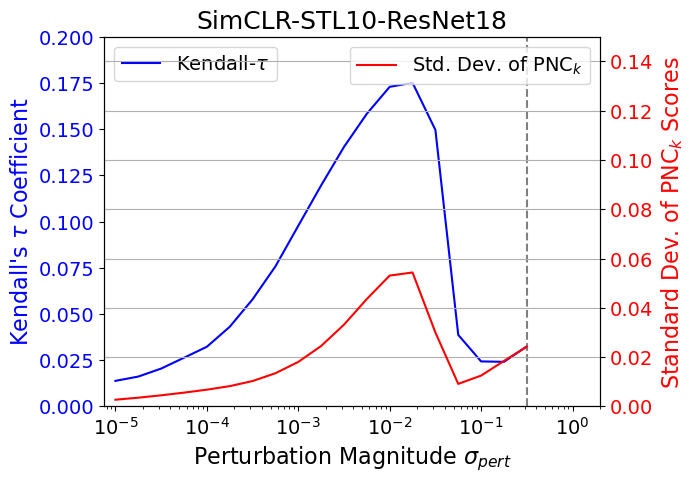

...

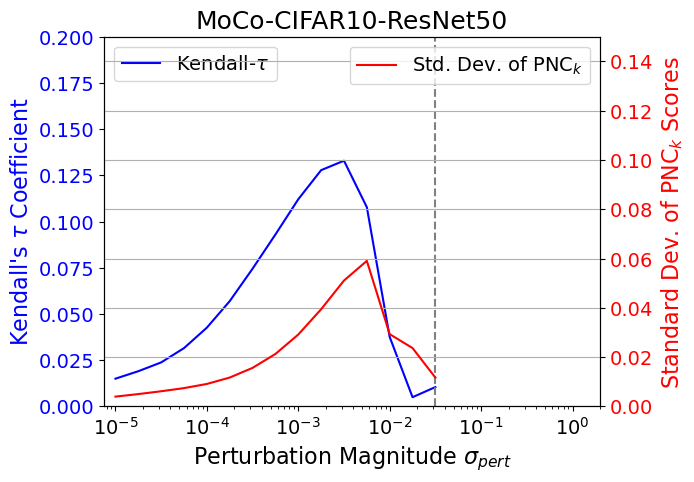

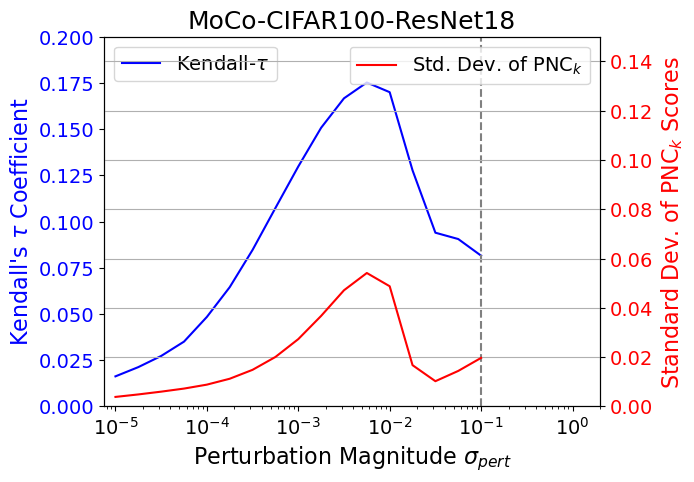

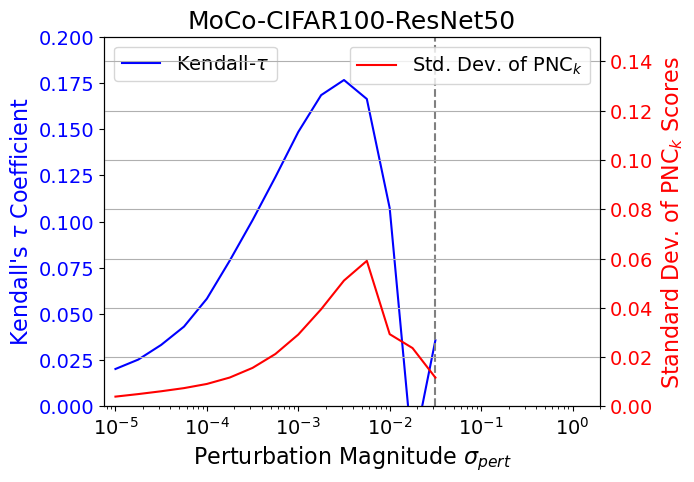

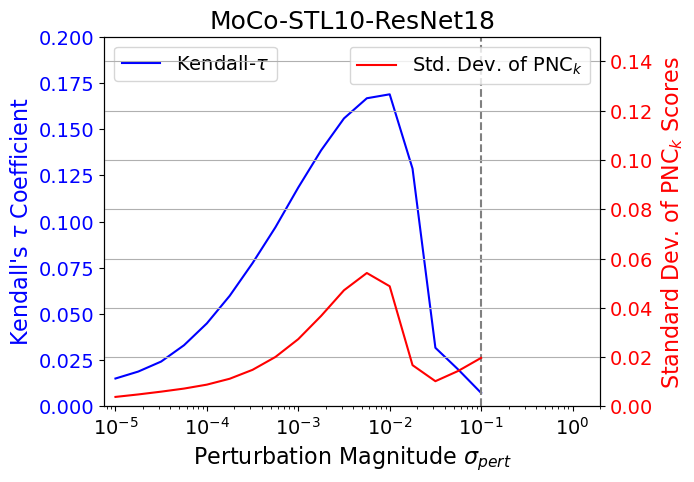

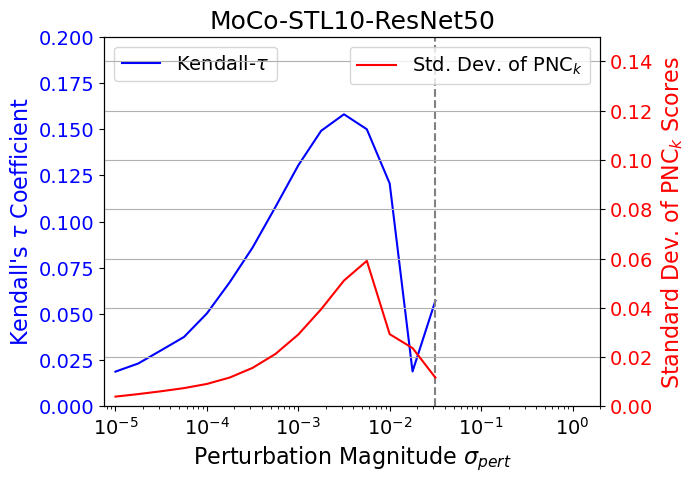

In [29]:
task = "binary"
perf = "brier"
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.20], [0.0, 0.15], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_random_{task}_{perf}.jpg")

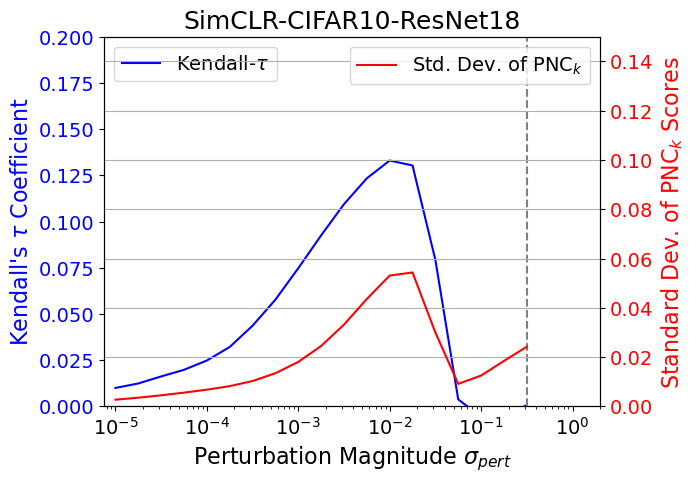

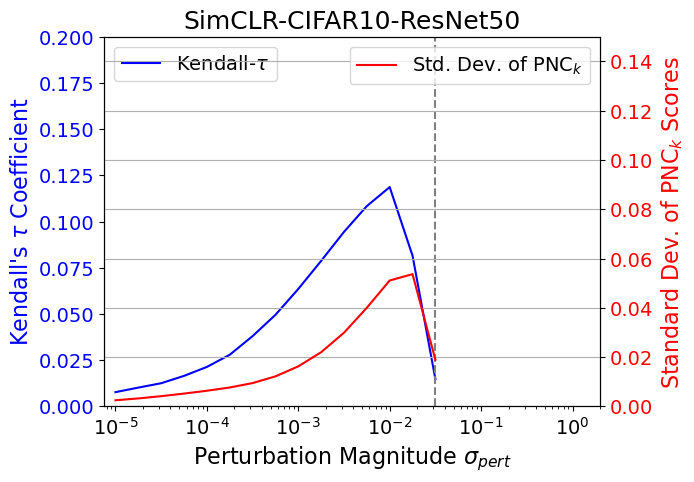

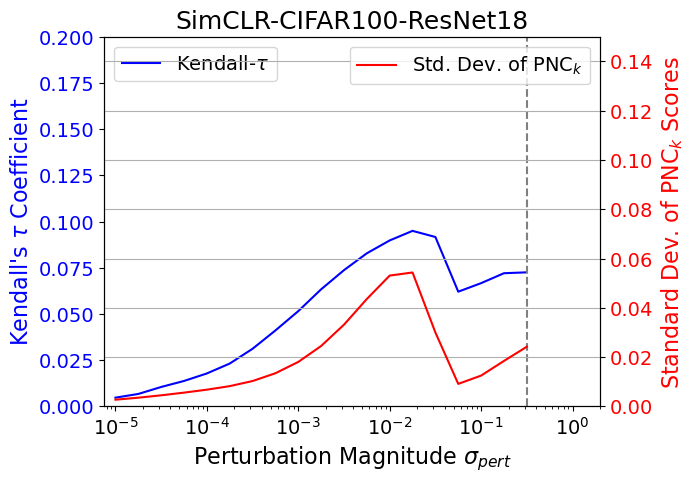

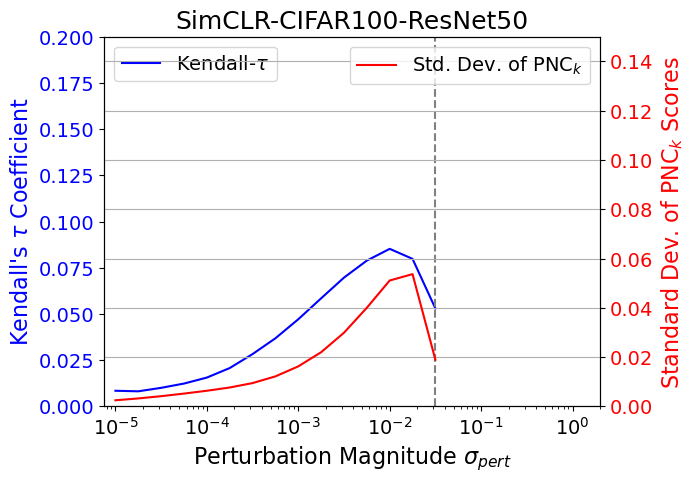

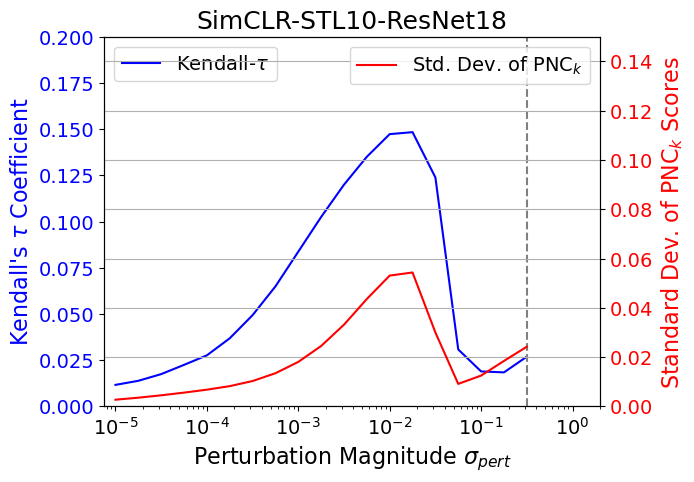

...

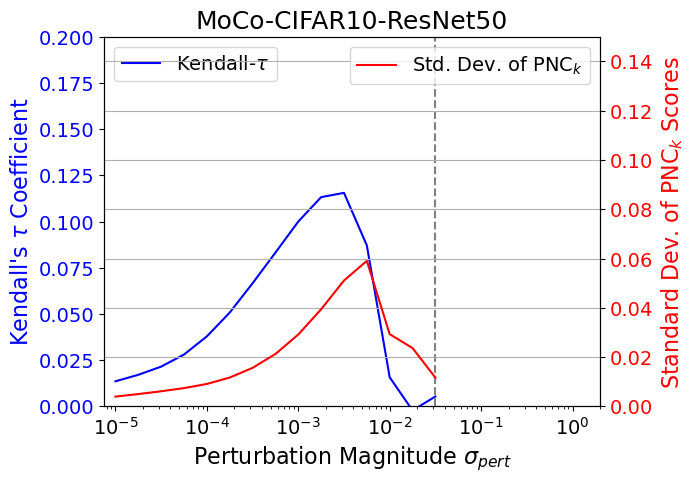

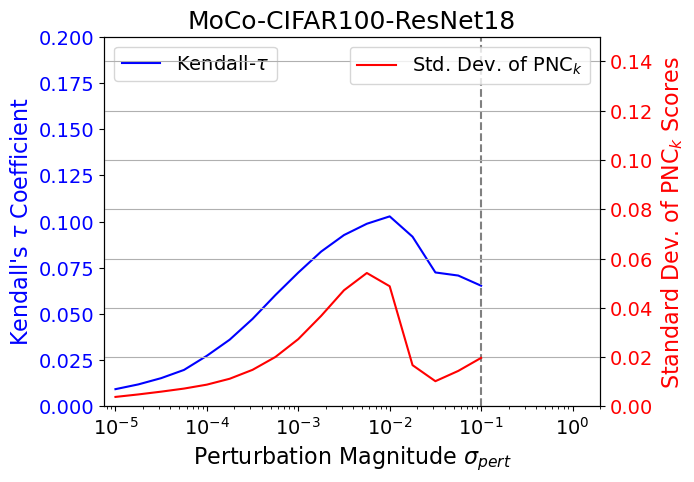

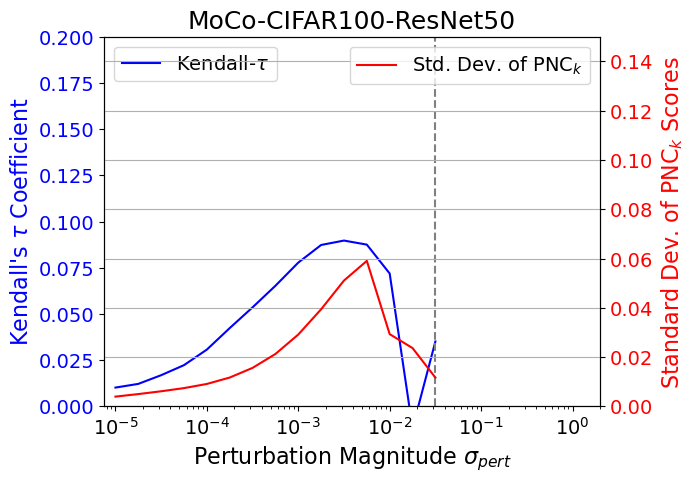

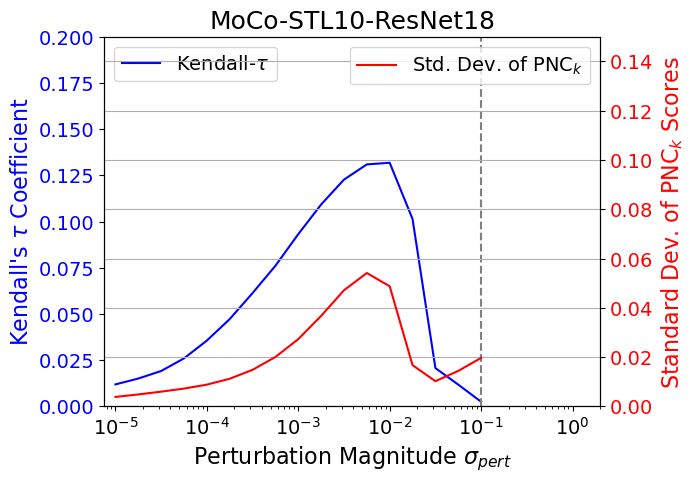

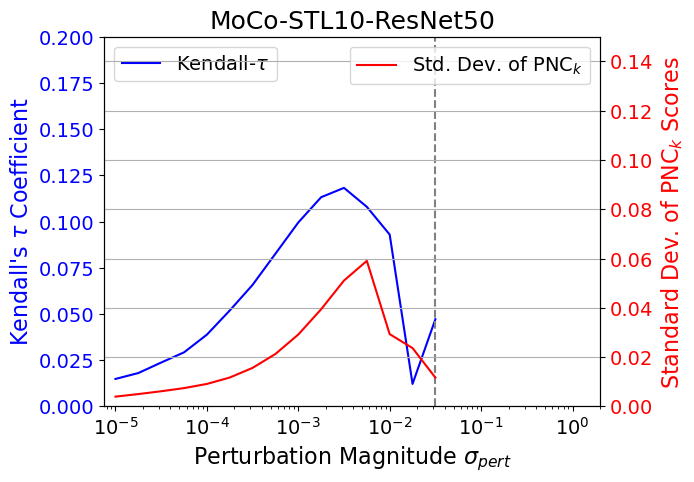

In [30]:
task = "multi"
perf = "brier"
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.20], [0.0, 0.15], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_random_{task}_{perf}.jpg")

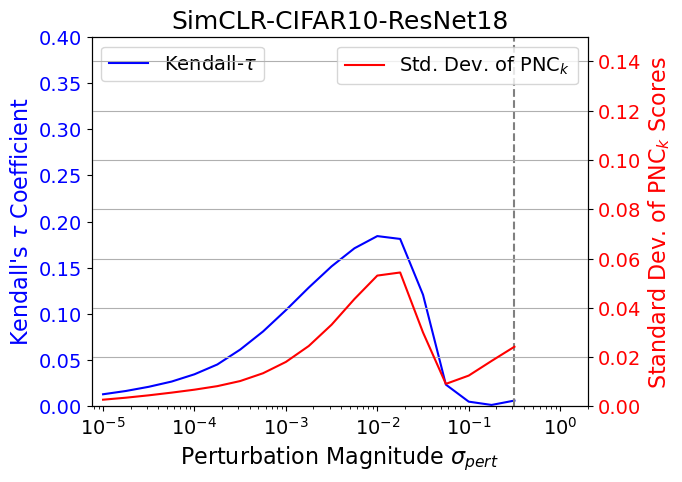

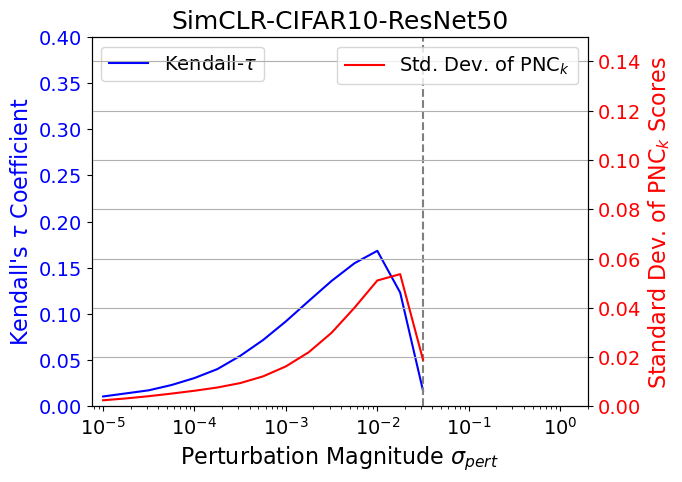

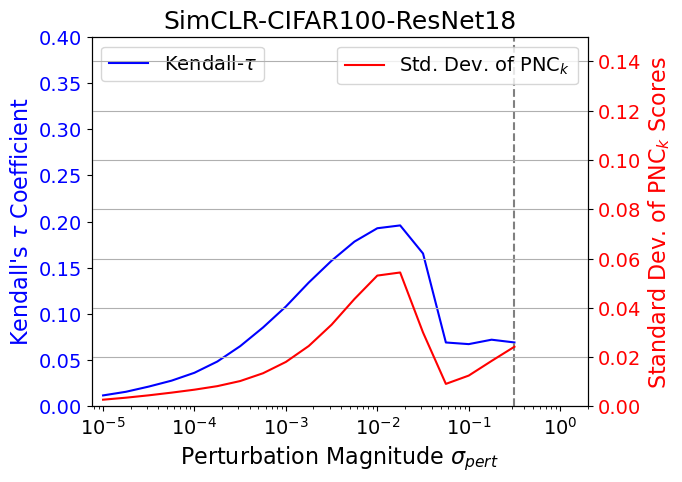

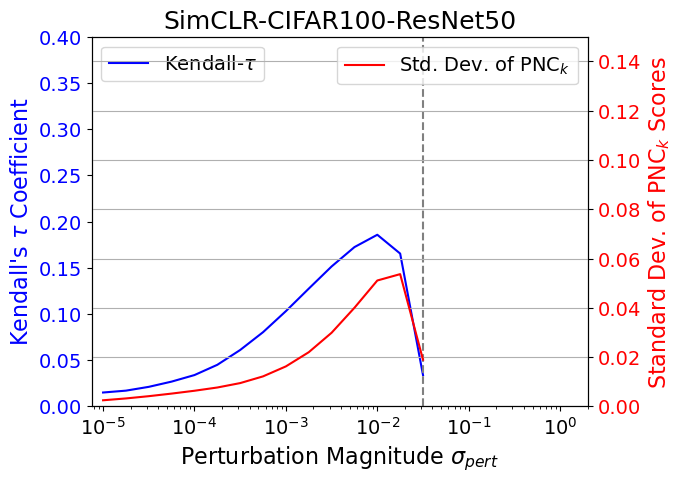

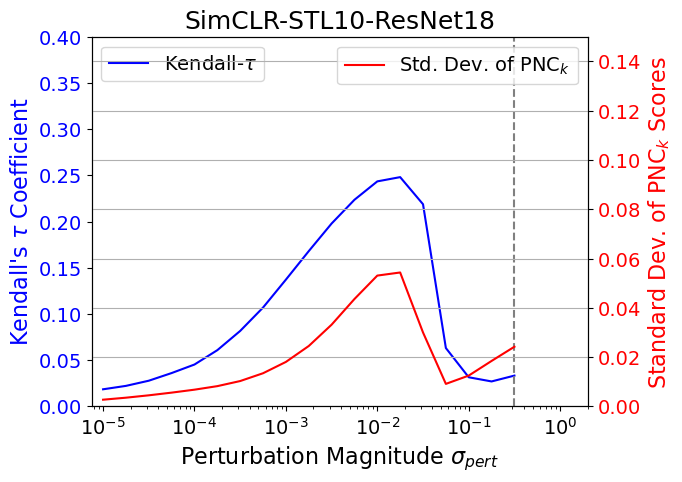

...

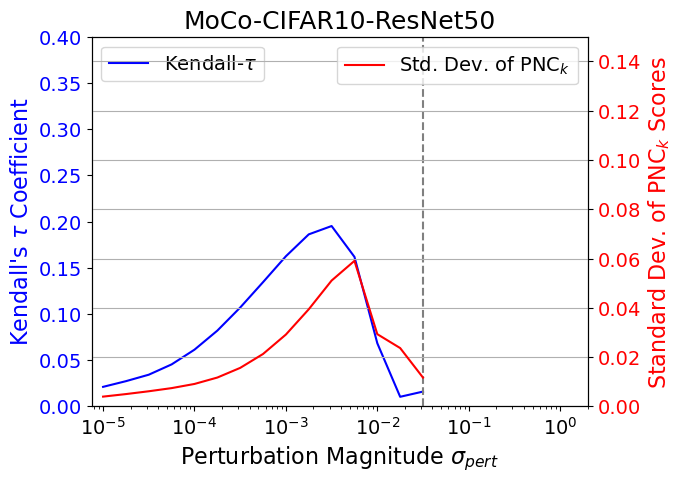

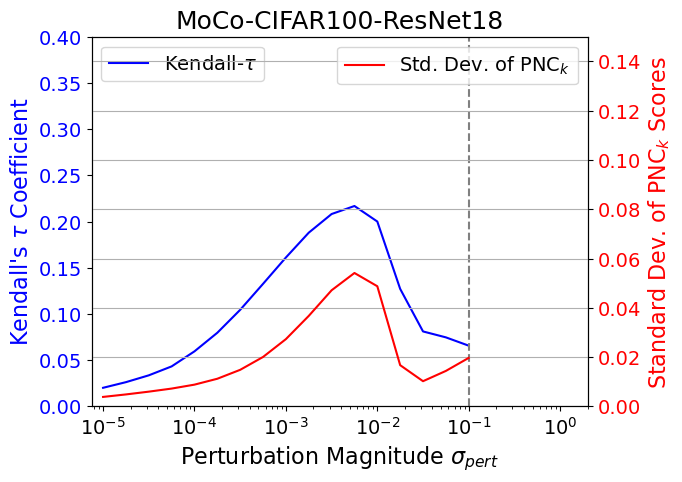

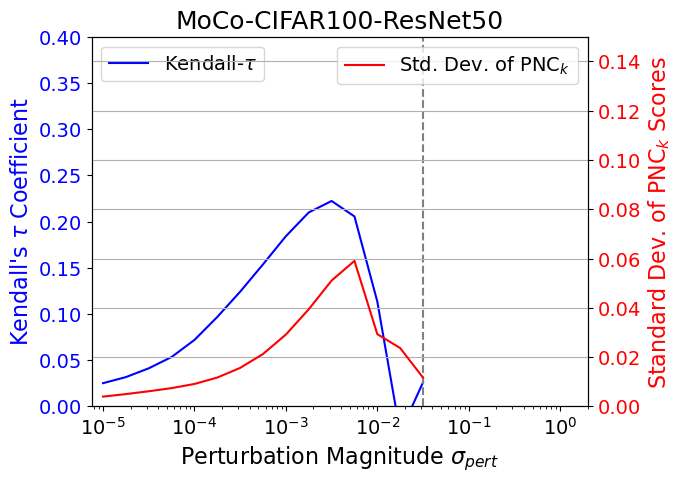

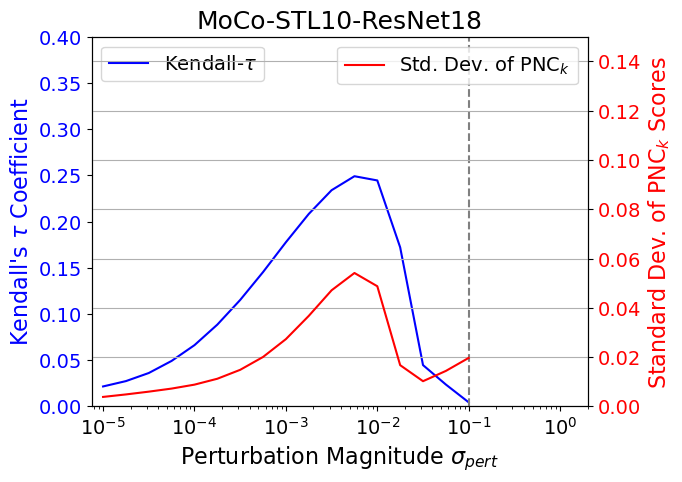

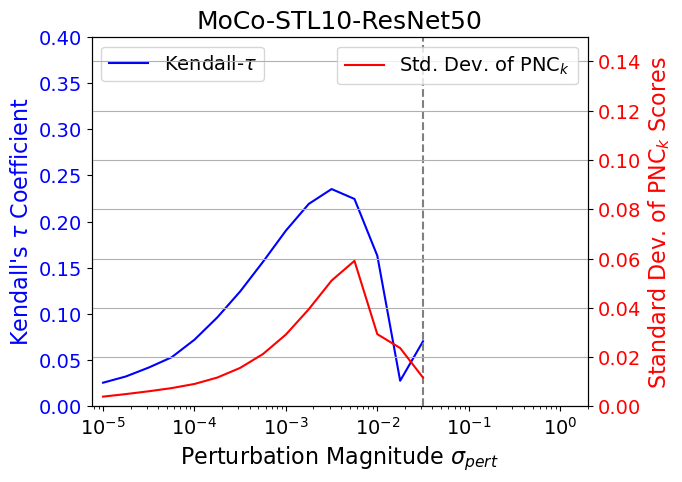

In [31]:
task = "binary"
perf = "pred_entropy"
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.40], [0.0, 0.15], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_random_{task}_{perf}.jpg")

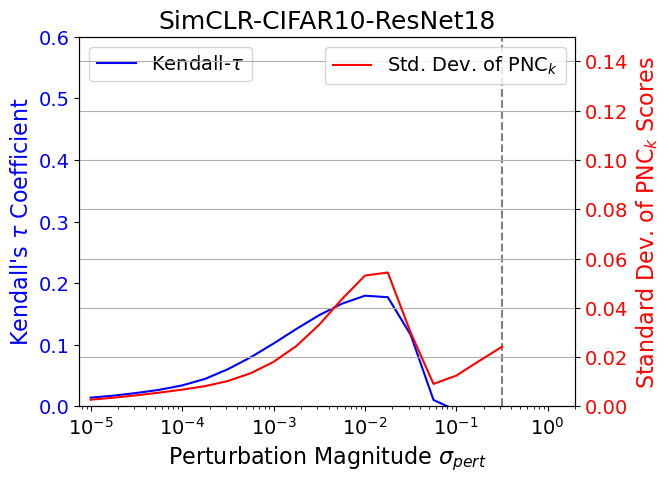

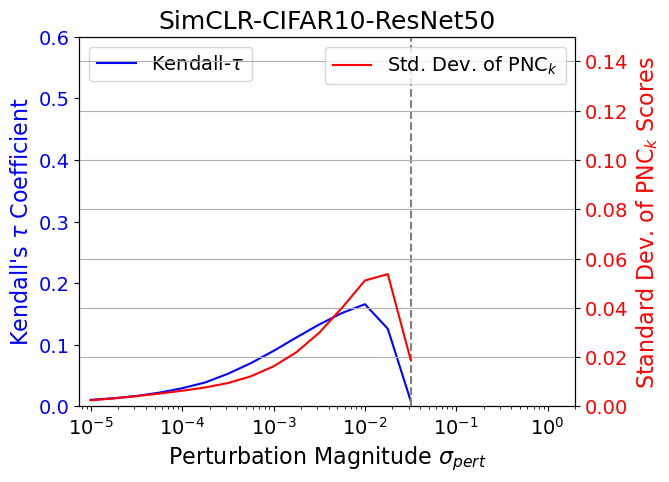

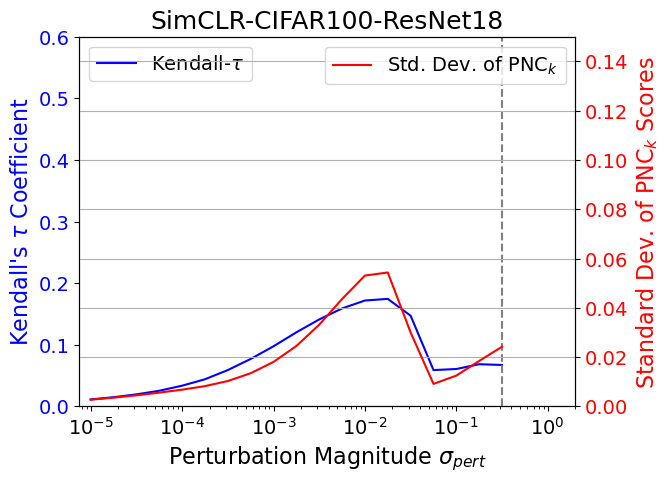

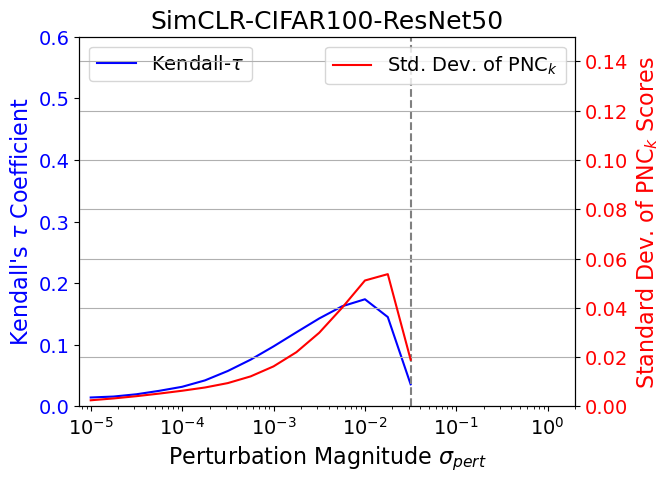

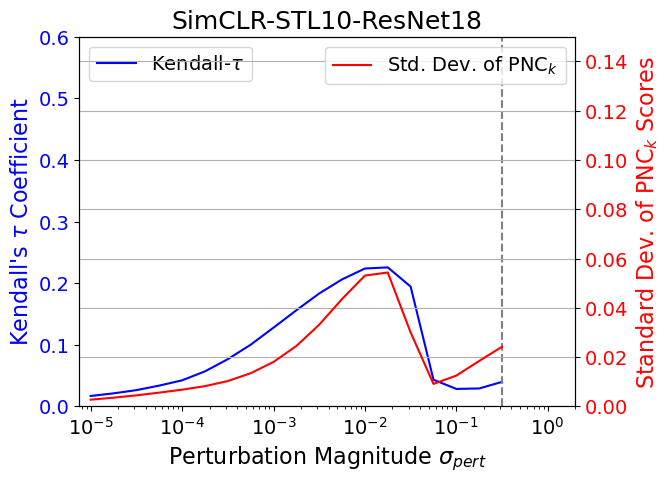

...

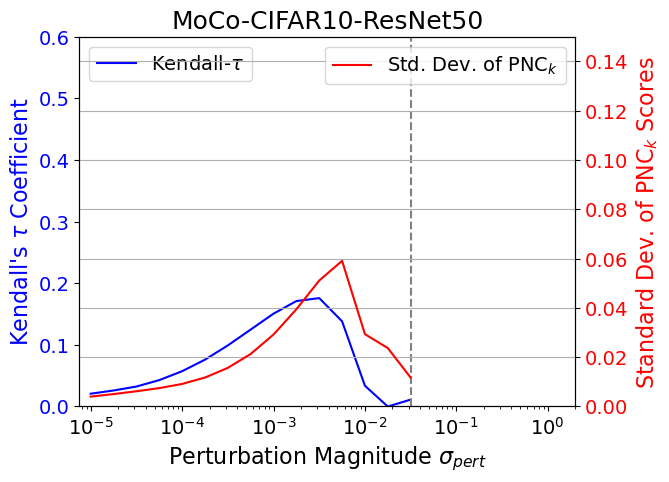

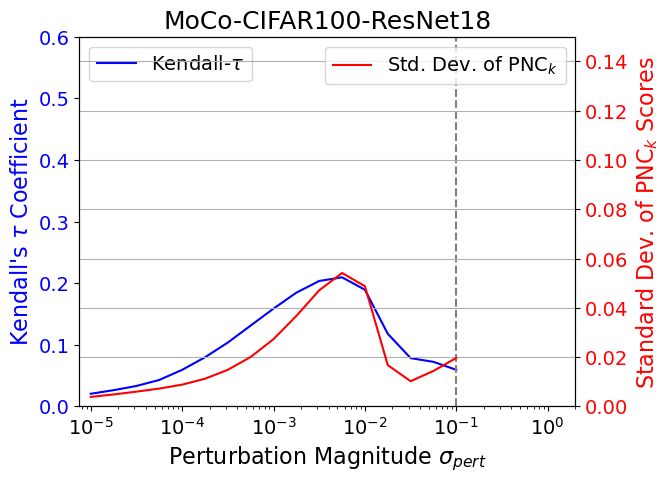

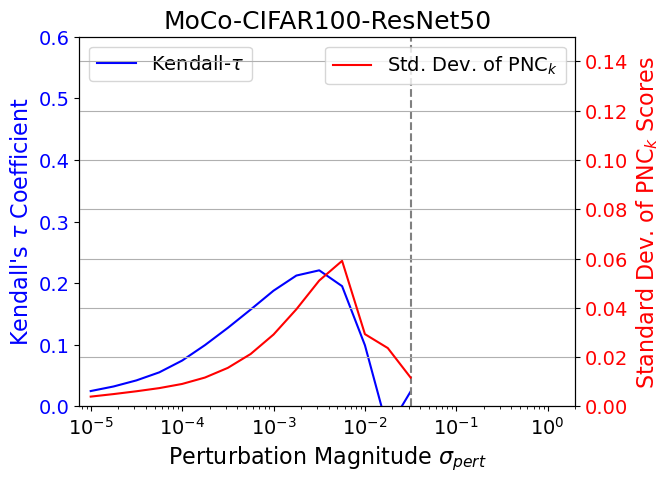

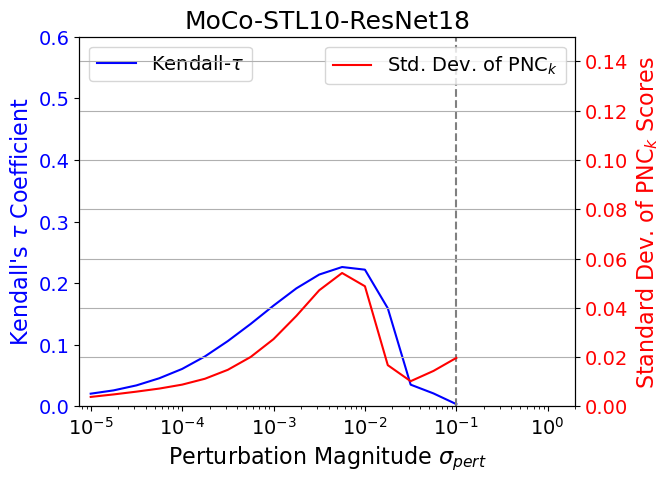

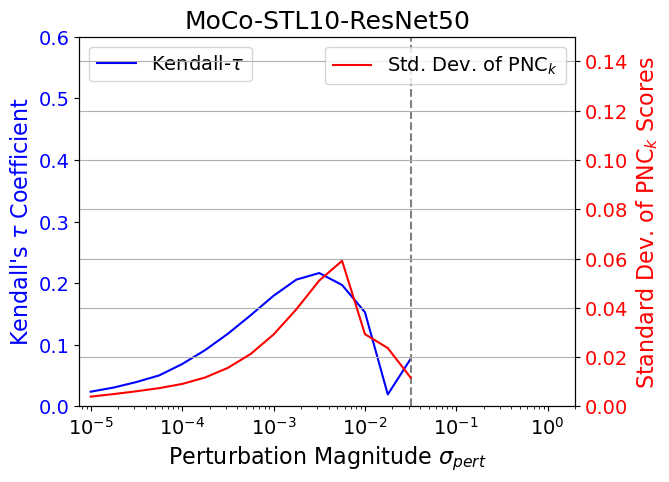

In [32]:
task = "multi"
perf = "pred_entropy"
pretrain = "imagenet32"
for ssl in ["simclr", "byol", "moco"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, "random", task, perf, f"{SSL_TO_LATEX[ssl]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.6], [0.0, 0.15], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_random_{task}_{perf}.jpg")

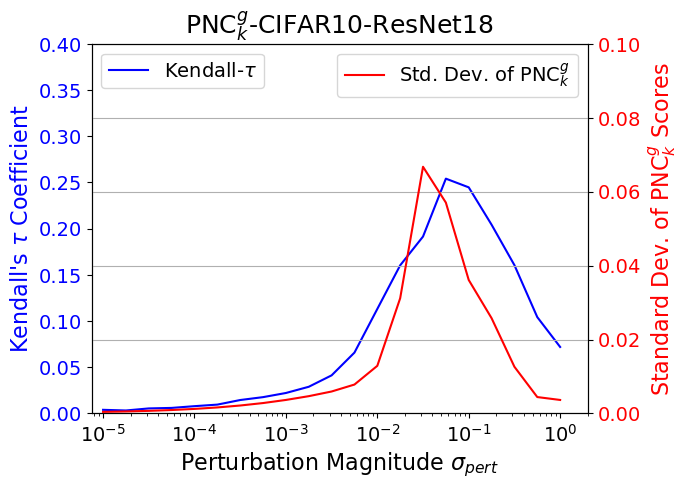

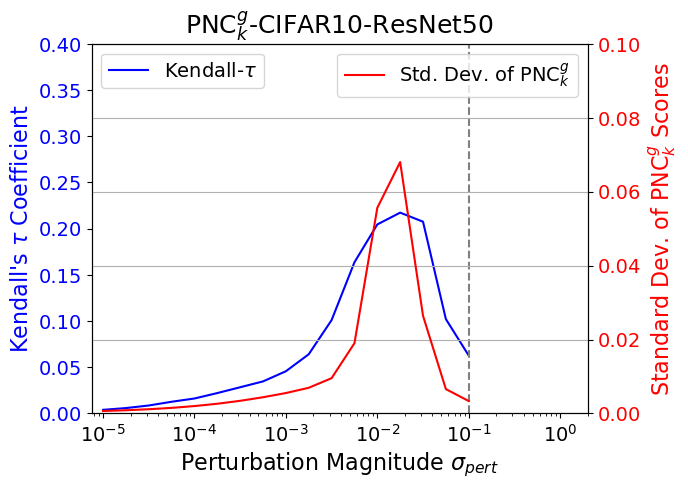

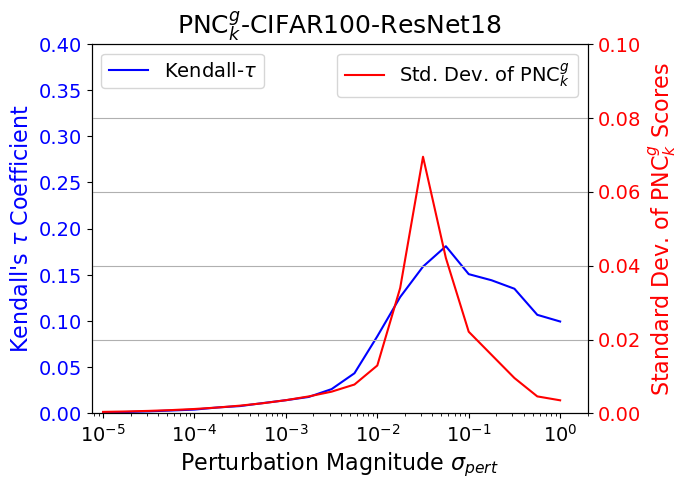

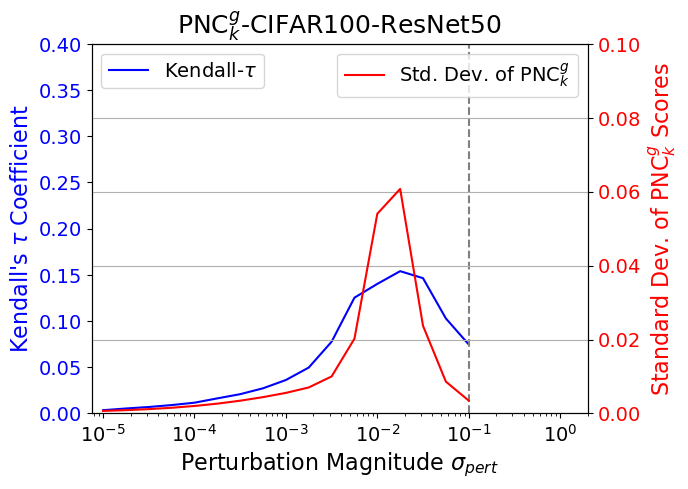

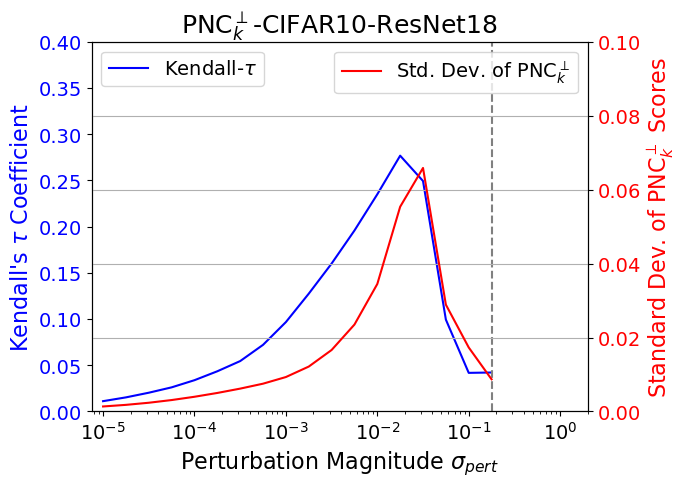

...

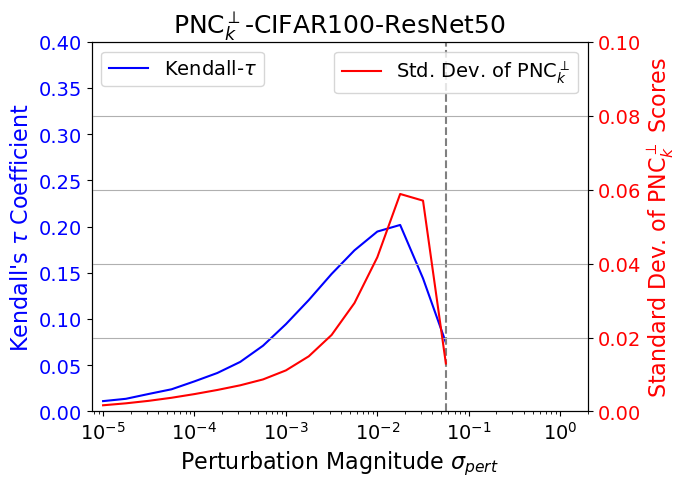

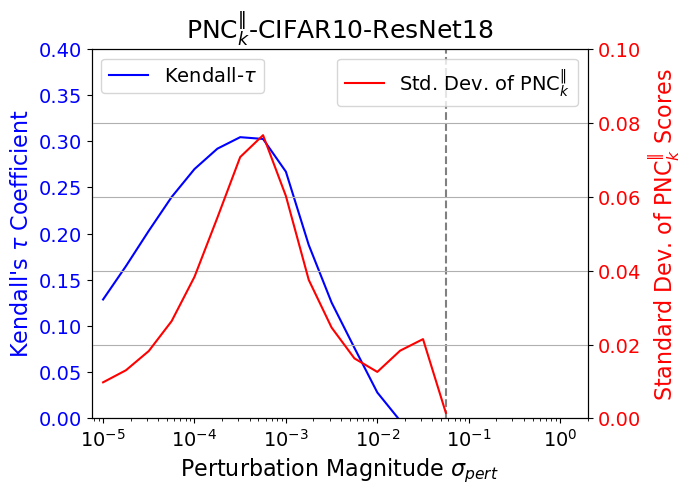

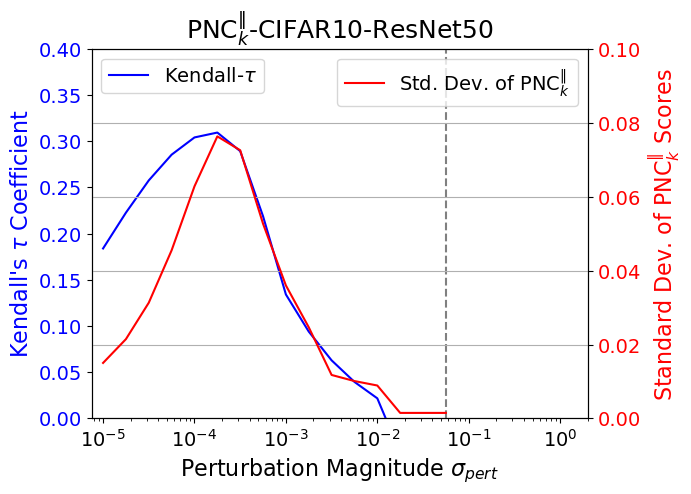

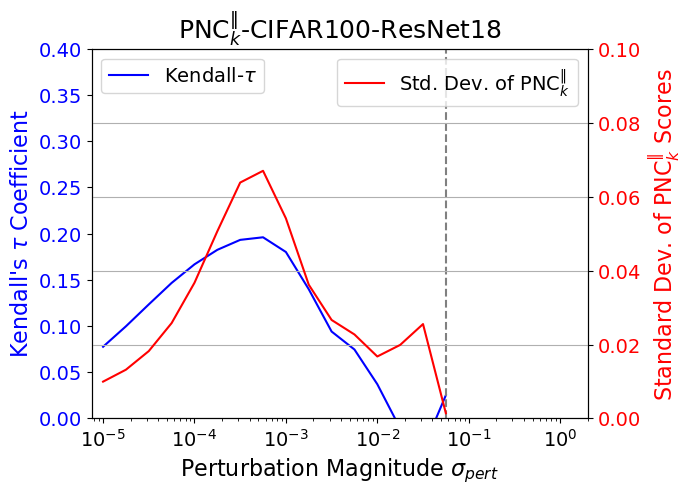

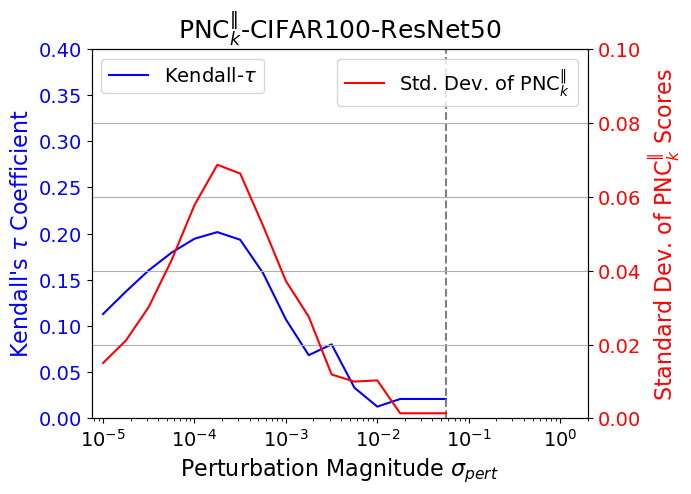

In [33]:
task = "binary"
perf = "brier"
ssl = "simclr"
for method in ["gradinv", "ortho_space", "in_space"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.40], [0.0, 0.10], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_{method}_{task}_{perf}.jpg")

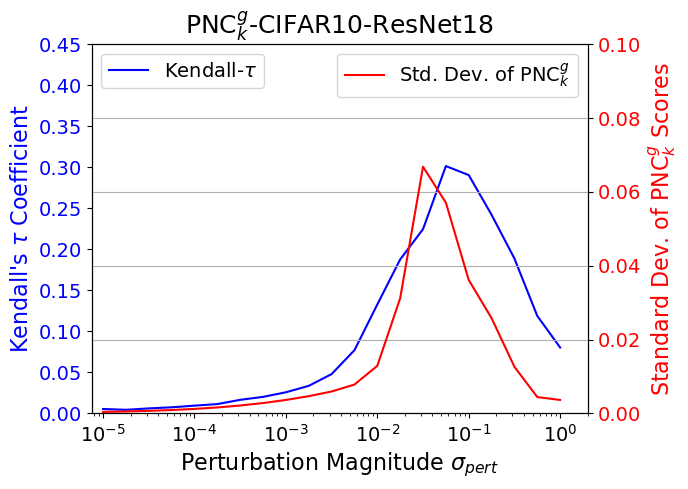

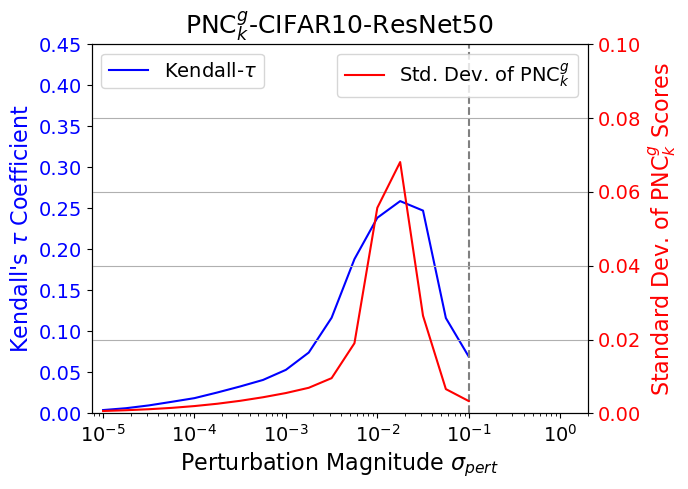

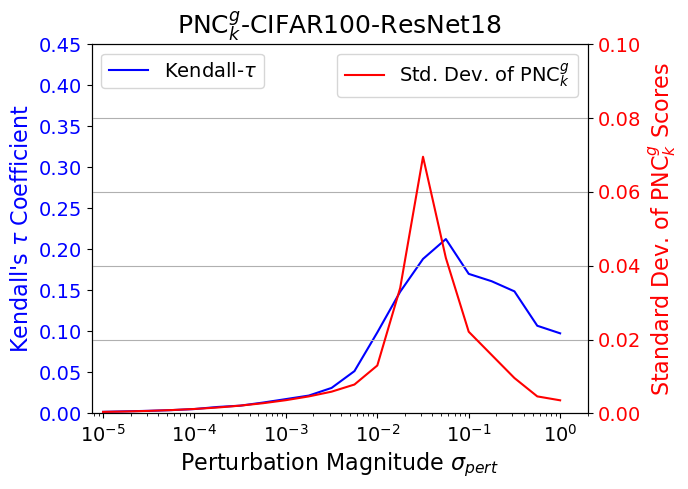

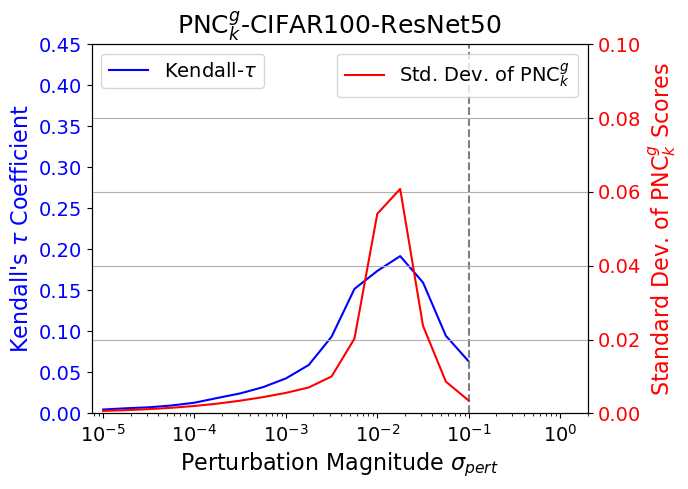

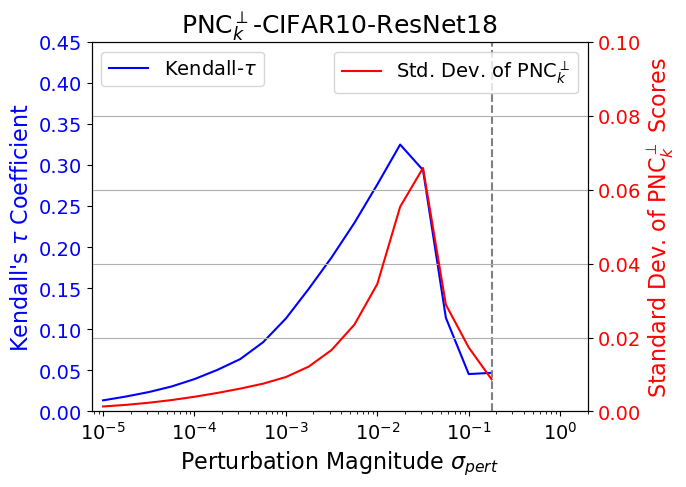

...

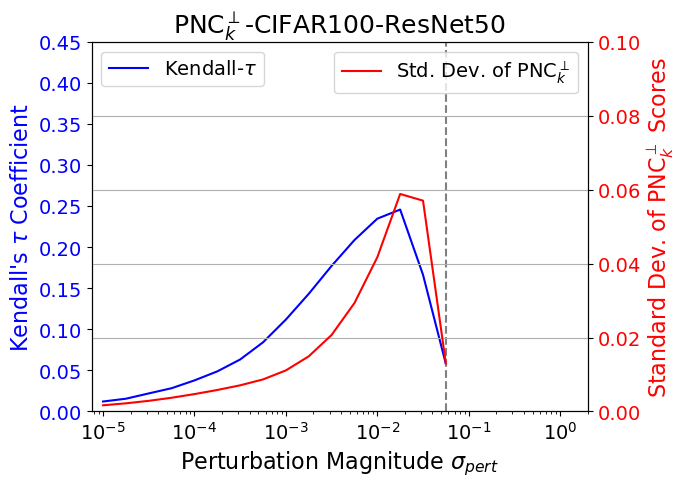

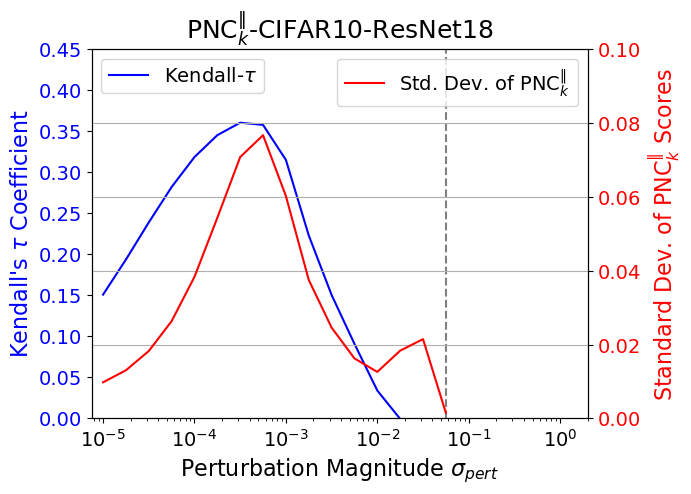

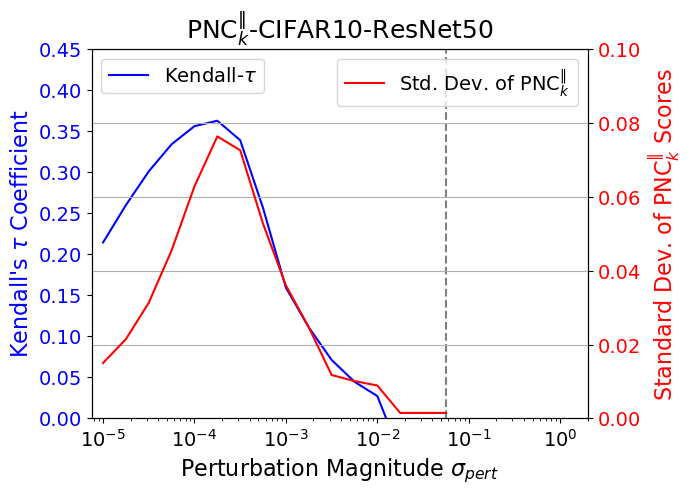

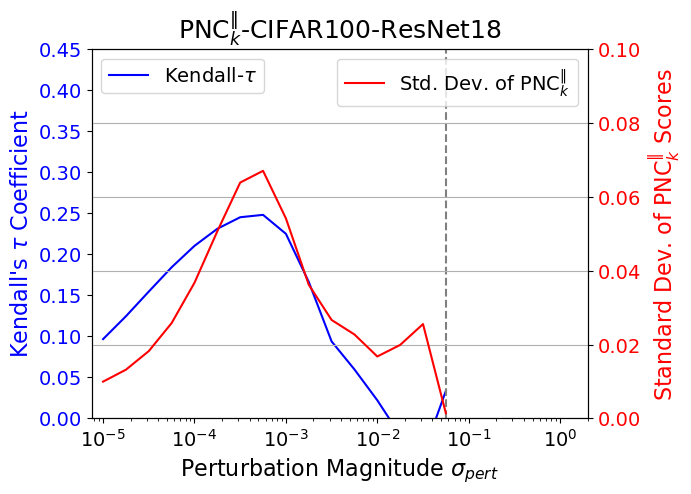

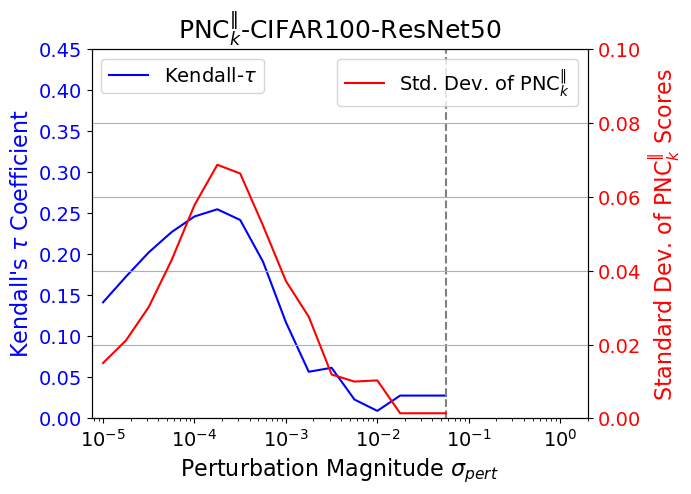

In [34]:
task = "binary"
perf = "pred_entropy"
ssl = "simclr"
for method in ["gradinv", "ortho_space", "in_space"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.45], [0.0, 0.10], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_{method}_{task}_{perf}.jpg")

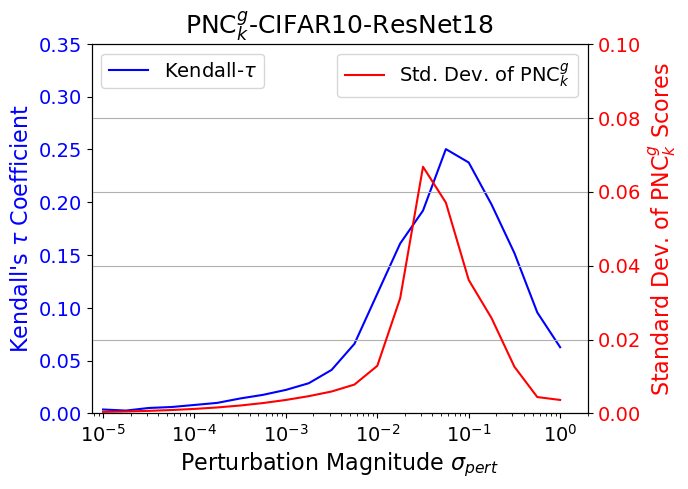

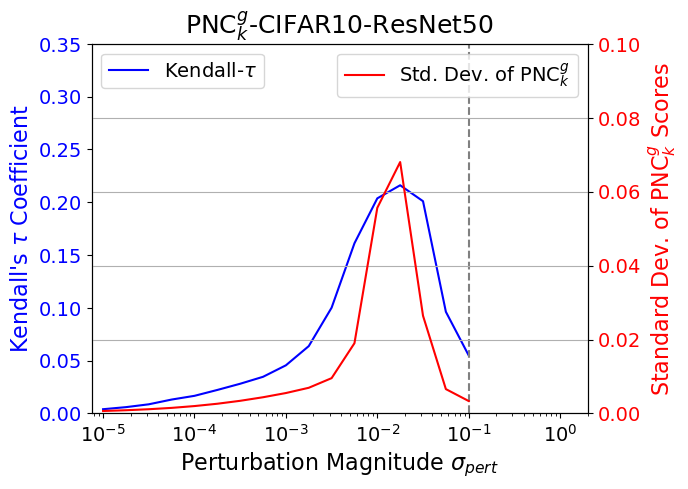

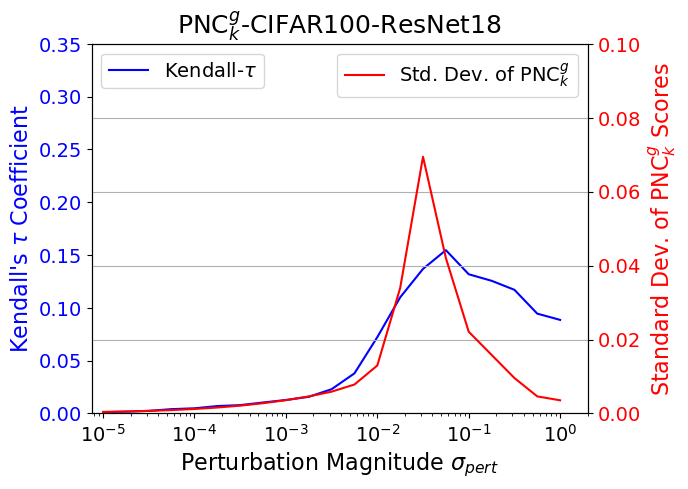

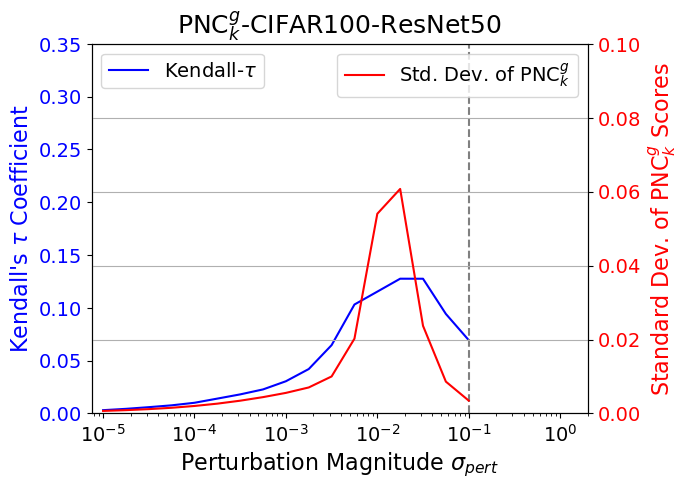

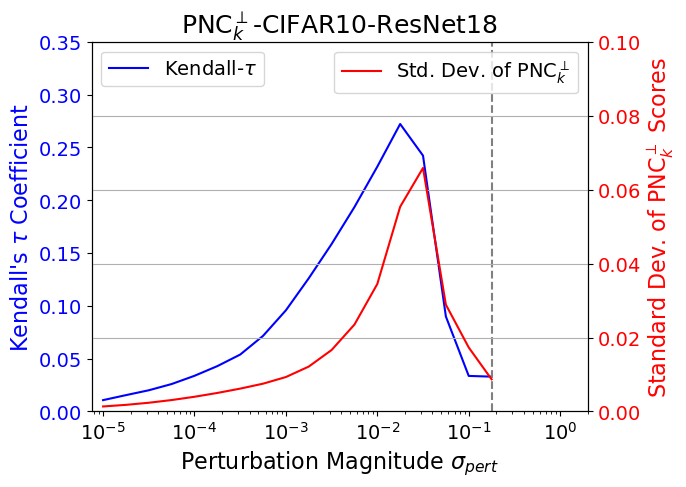

...

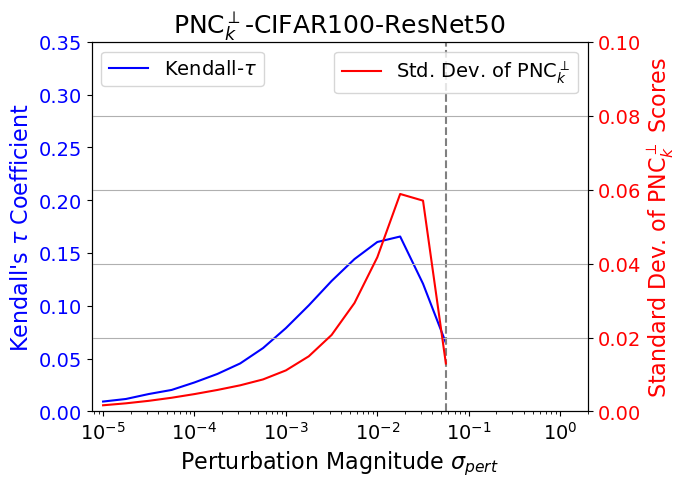

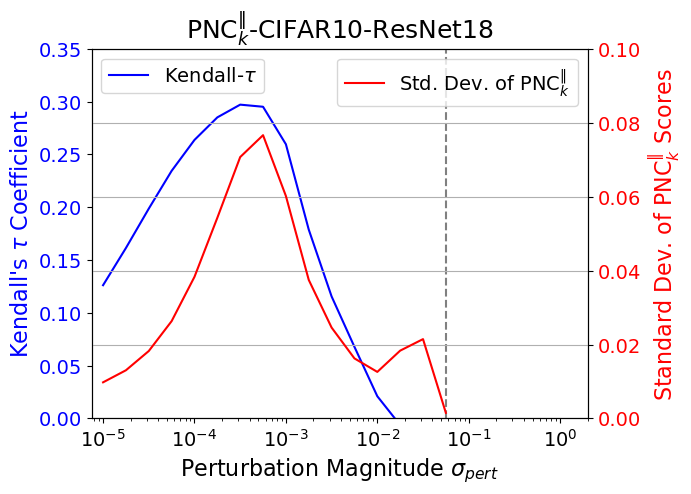

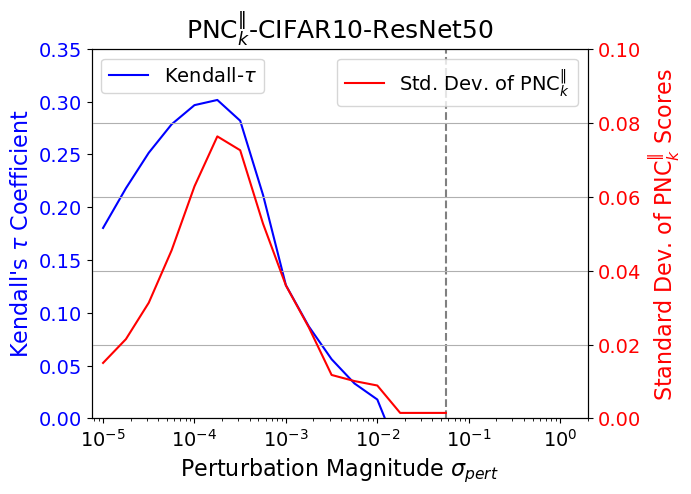

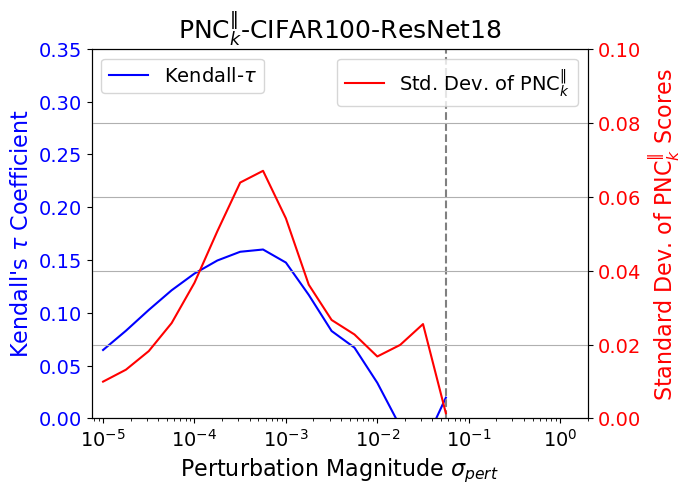

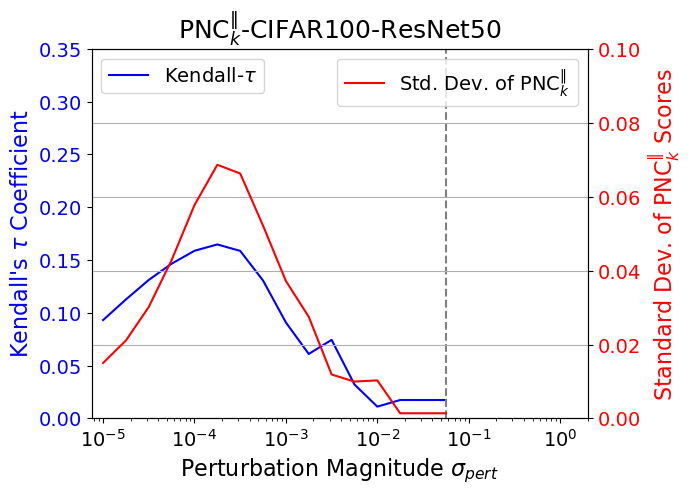

In [35]:
task = "multi"
perf = "brier"
ssl = "simclr"
for method in ["gradinv", "ortho_space", "in_space"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.35], [0.0, 0.10], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_{method}_{task}_{perf}.jpg")

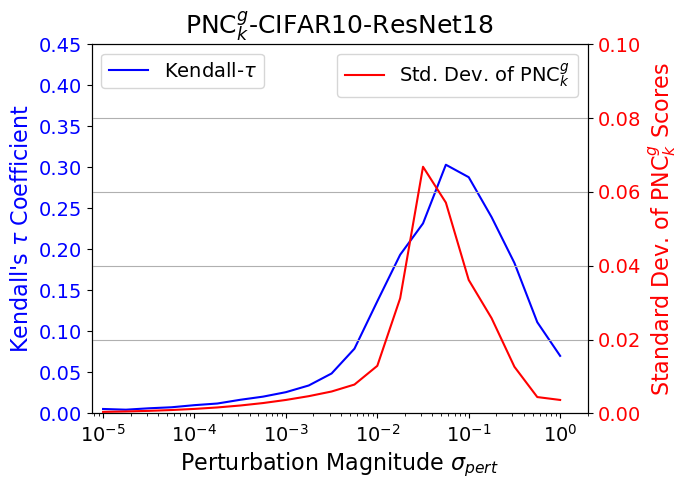

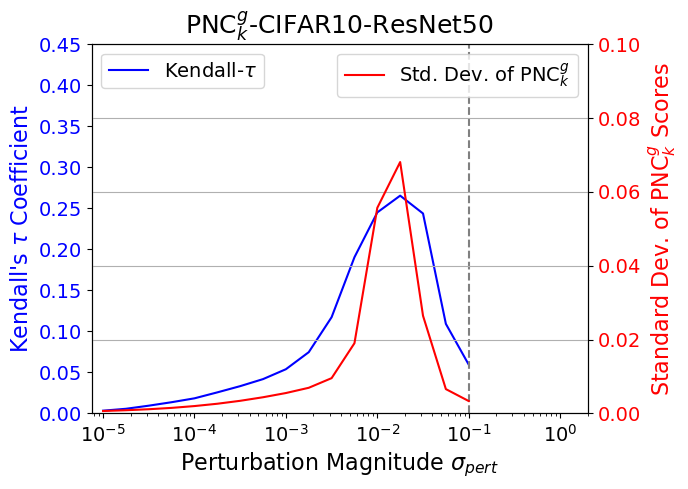

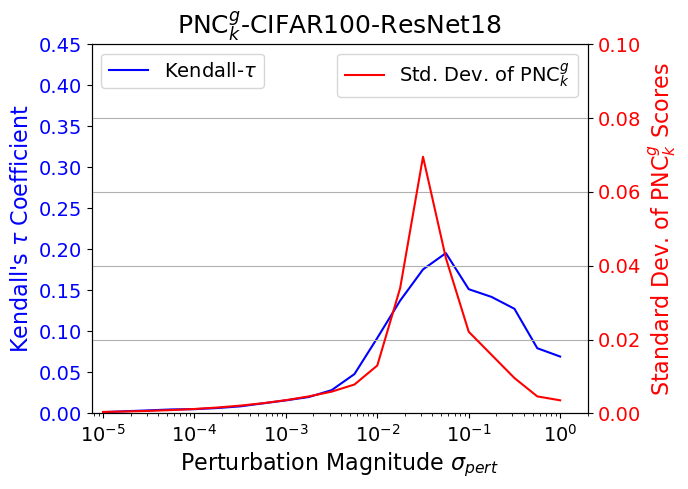

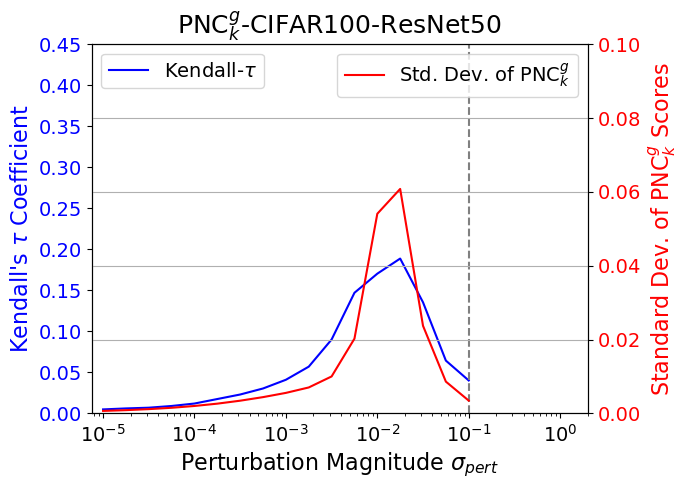

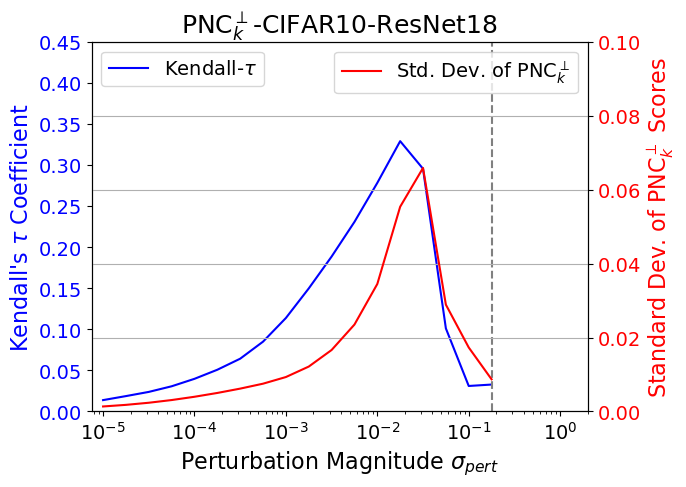

...

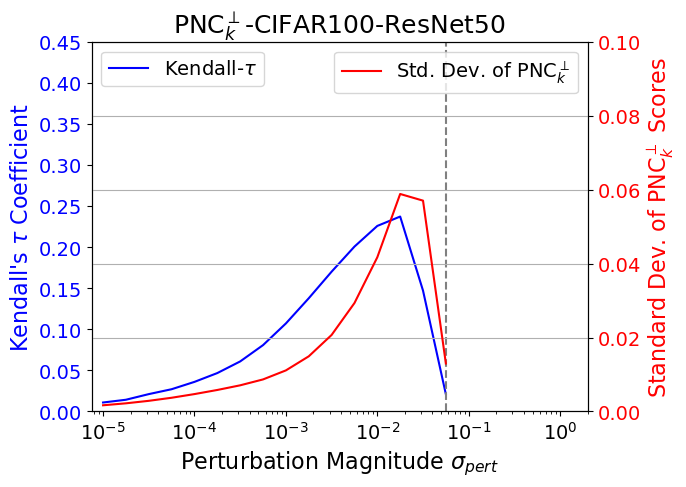

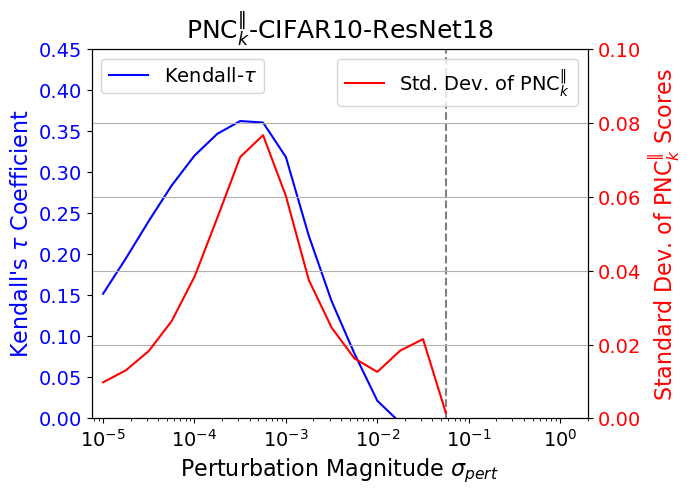

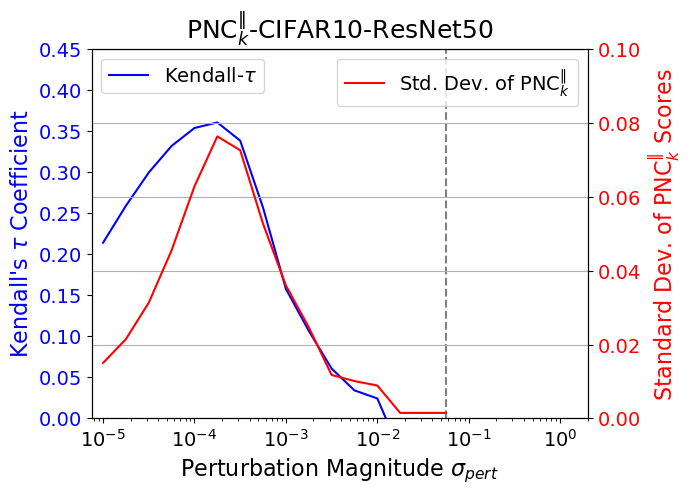

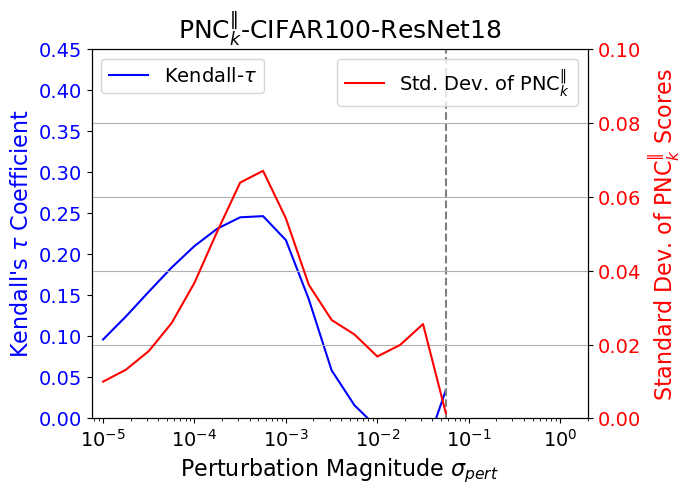

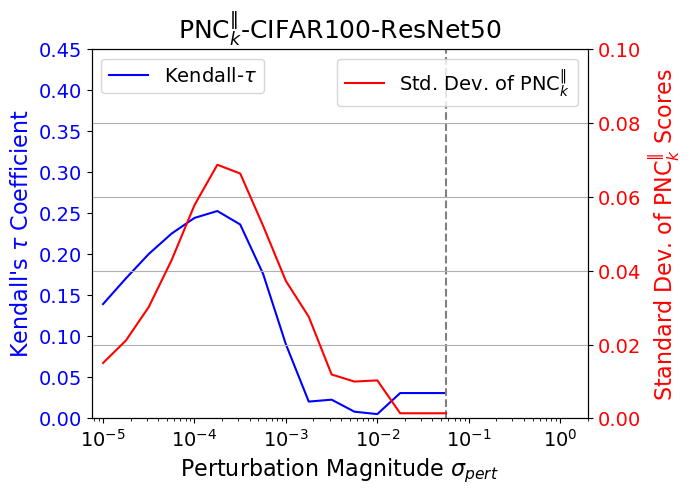

In [36]:
task = "multi"
perf = "pred_entropy"
ssl = "simclr"
for method in ["gradinv", "ortho_space", "in_space"]:
    for pretrain in ["cifar10", "cifar100"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, pretrain, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[pretrain]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.45], [0.0, 0.10], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{pretrain}_{method}_{task}_{perf}.jpg")

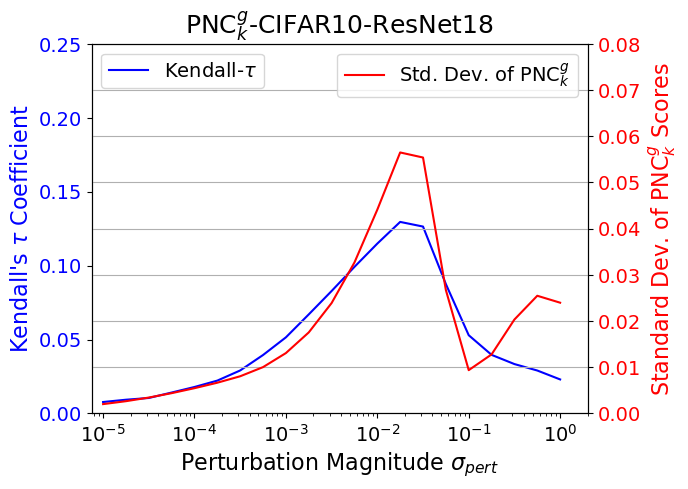

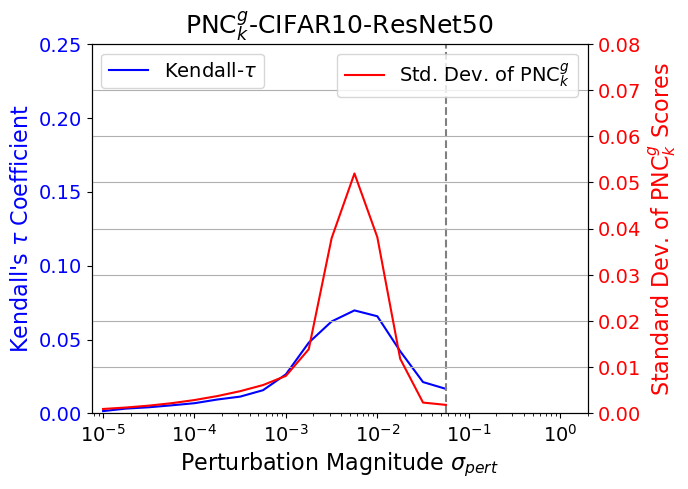

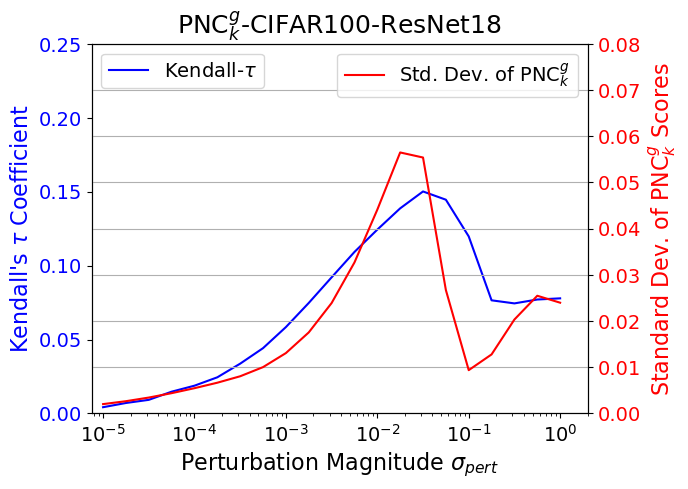

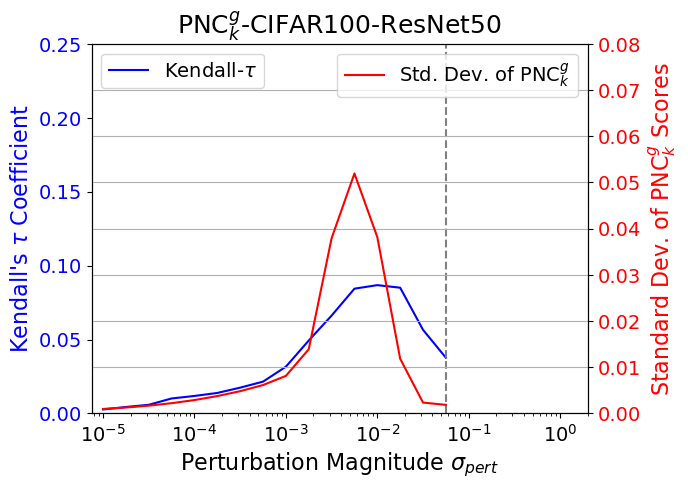

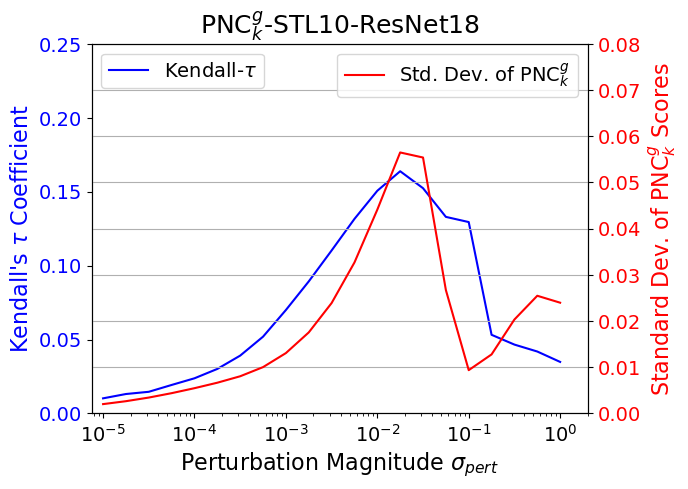

...

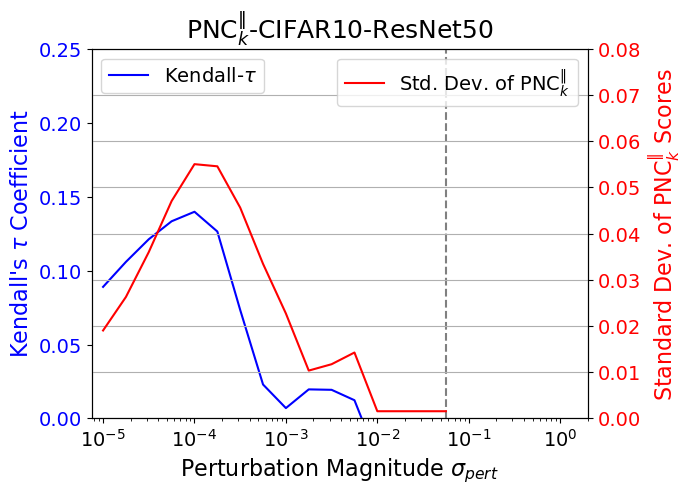

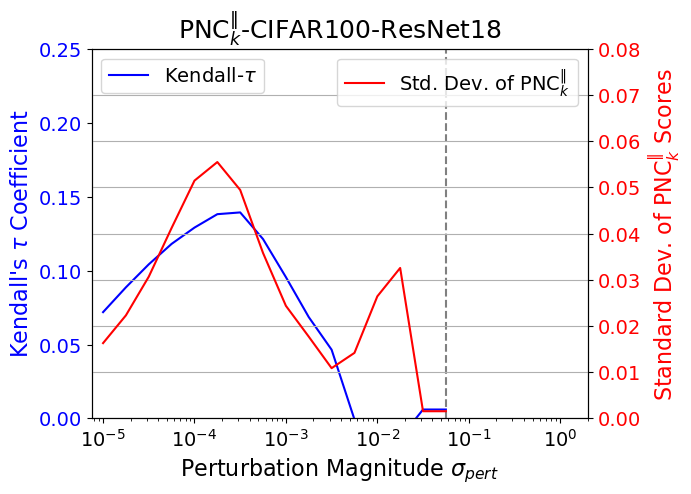

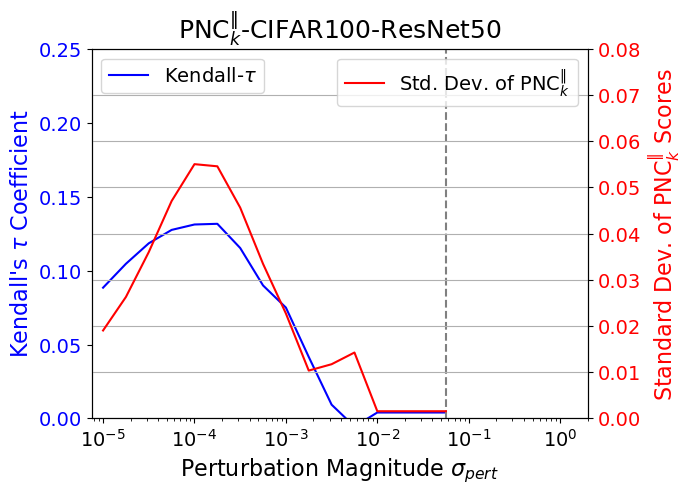

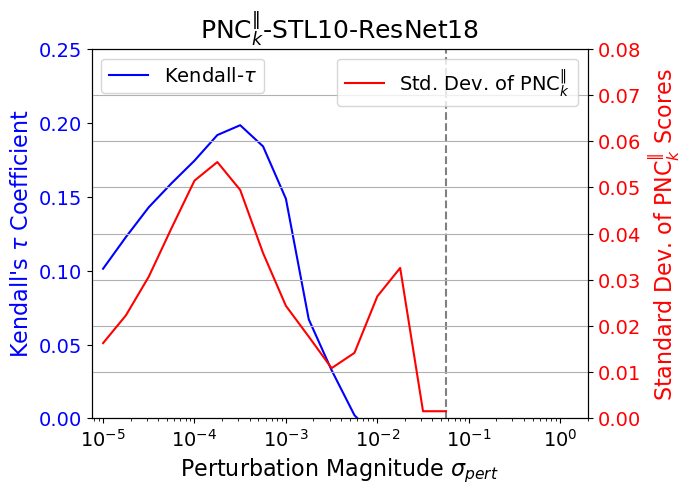

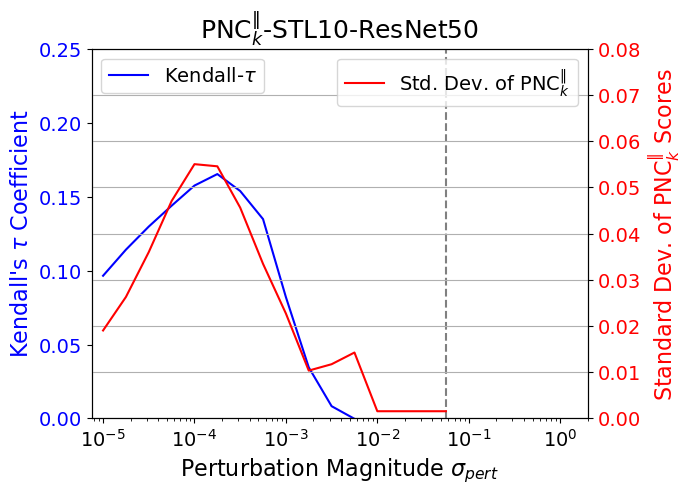

In [37]:
task = "binary"
perf = "brier"
ssl = "simclr"
pretrain = "imagenet32"
for method in ["gradinv", "ortho_space", "in_space"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.25], [0.0, 0.08], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_{method}_{task}_{perf}.jpg")

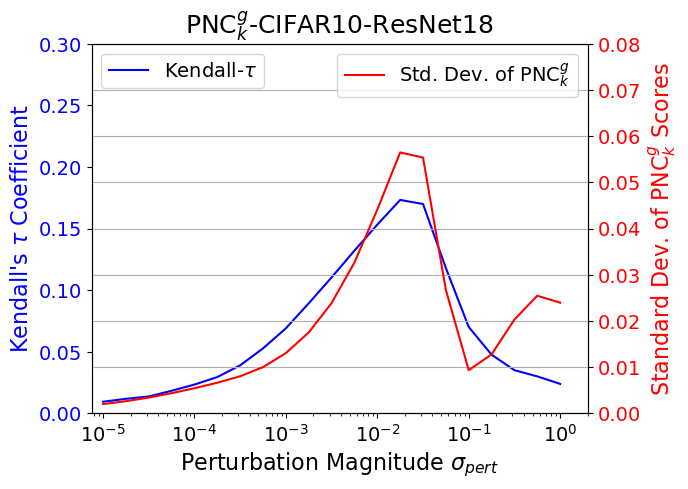

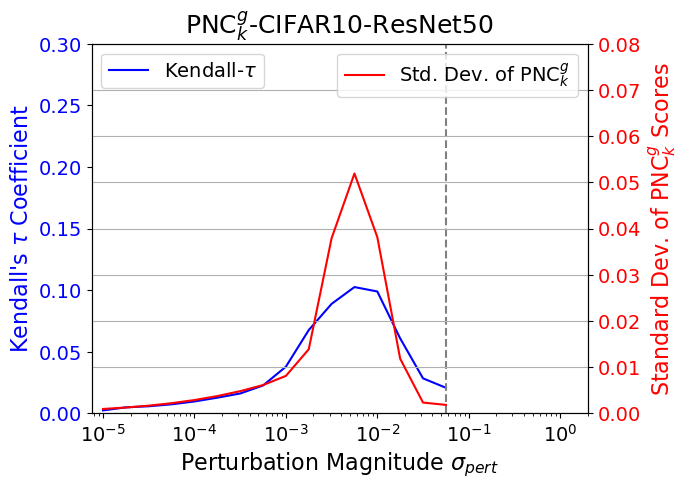

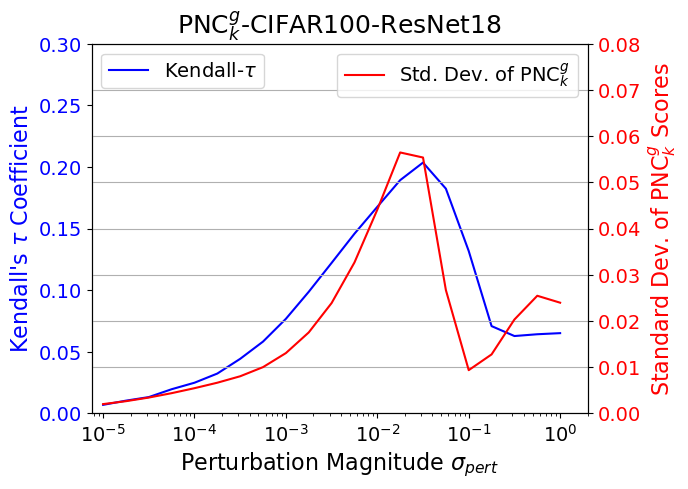

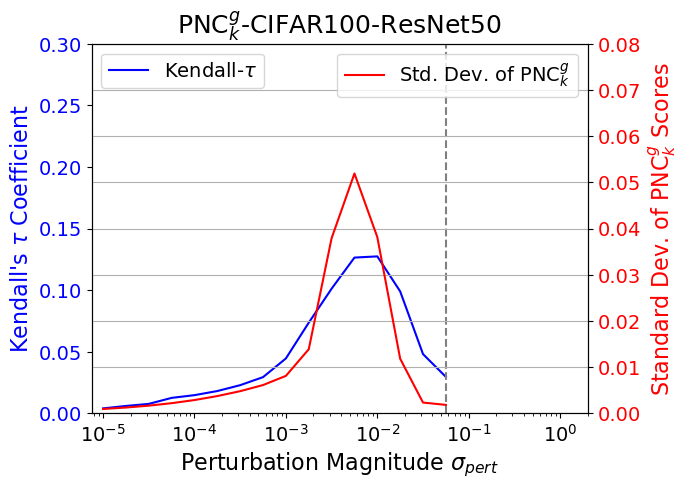

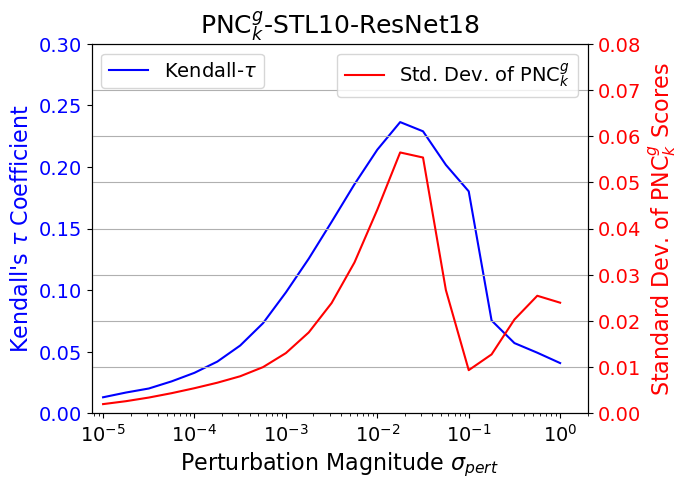

...

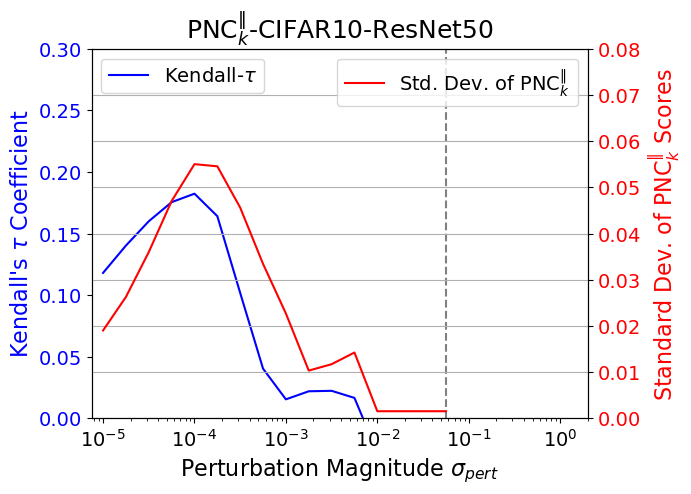

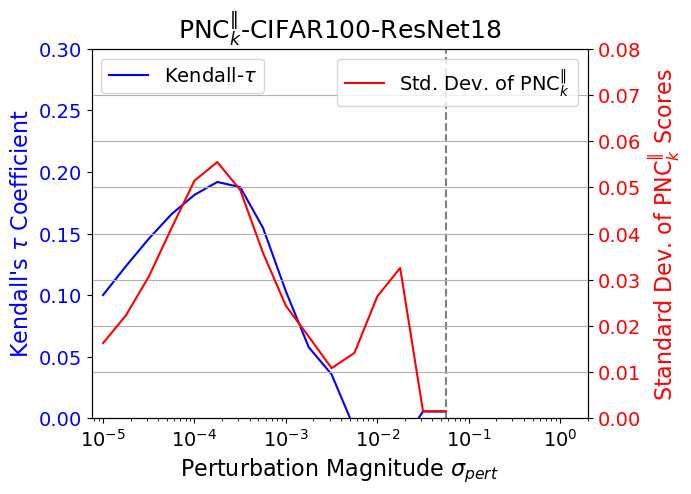

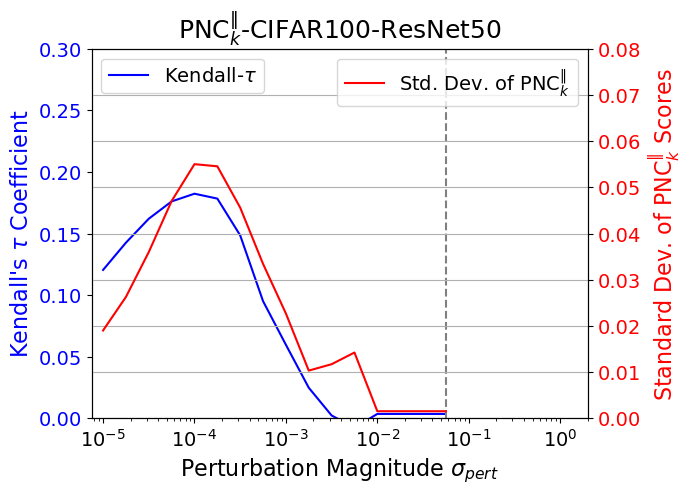

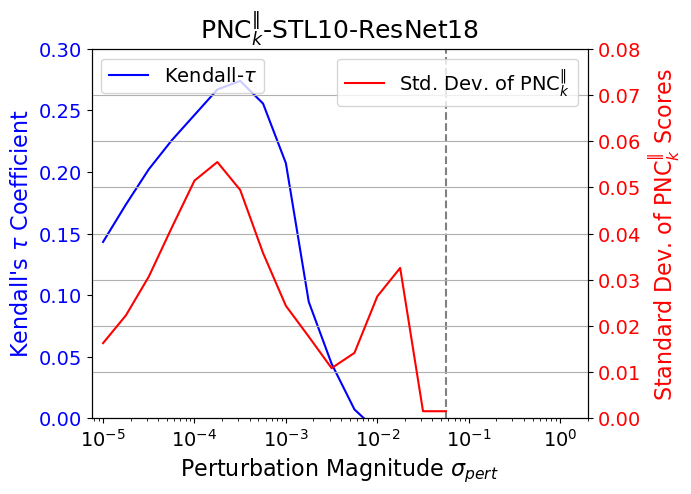

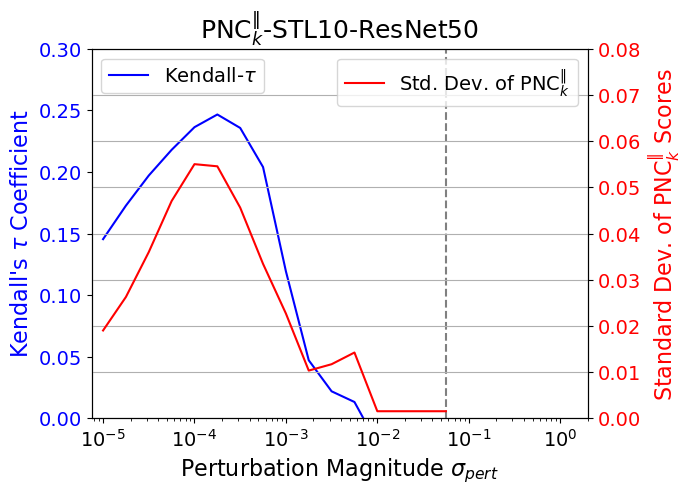

In [38]:
task = "binary"
perf = "pred_entropy"
ssl = "simclr"
pretrain = "imagenet32"
for method in ["gradinv", "ortho_space", "in_space"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.30], [0.0, 0.08], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_{method}_{task}_{perf}.jpg")

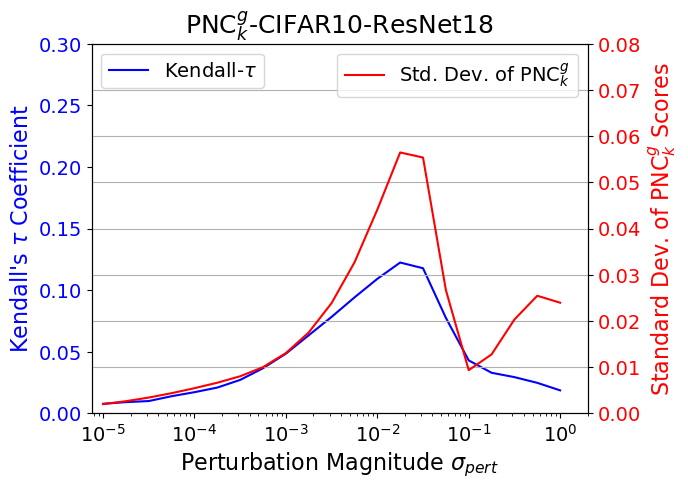

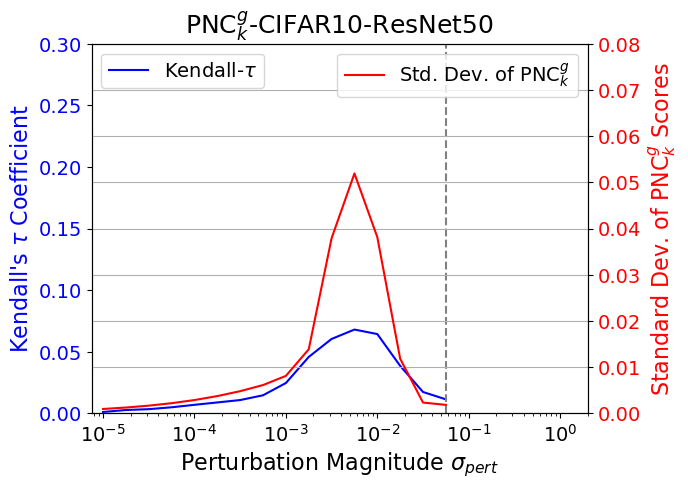

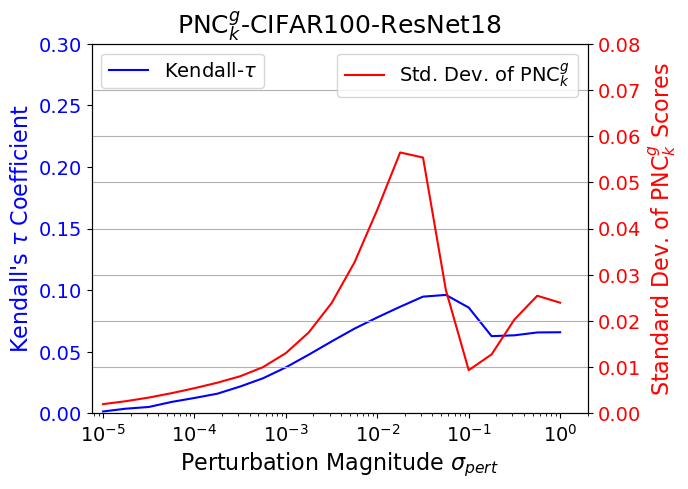

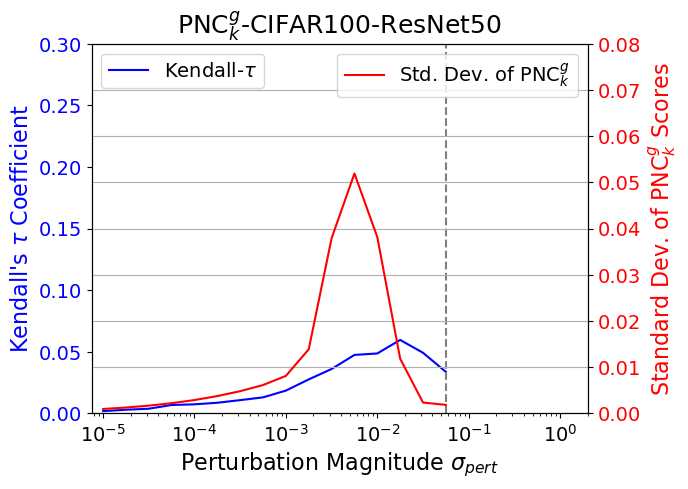

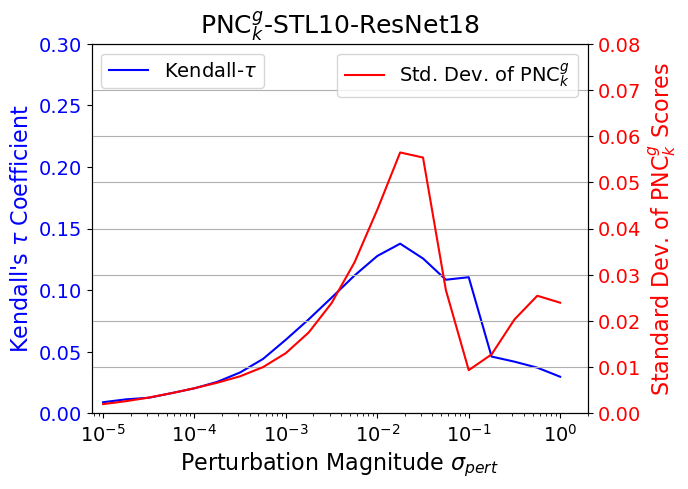

...

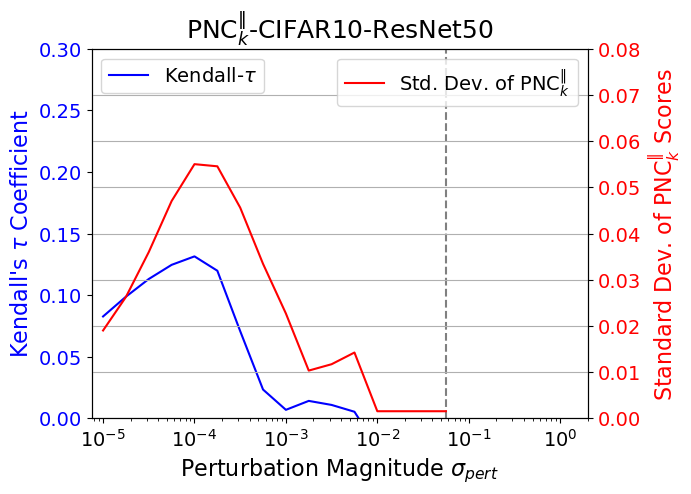

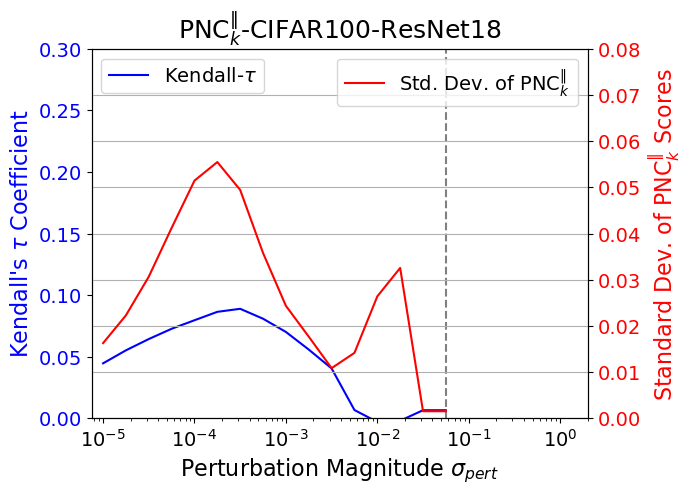

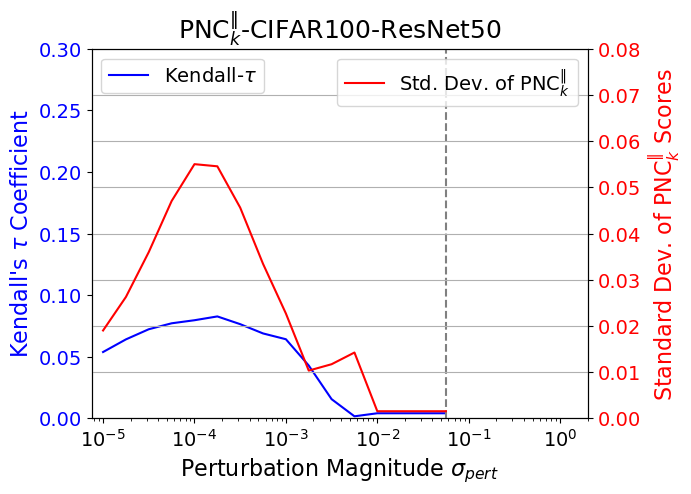

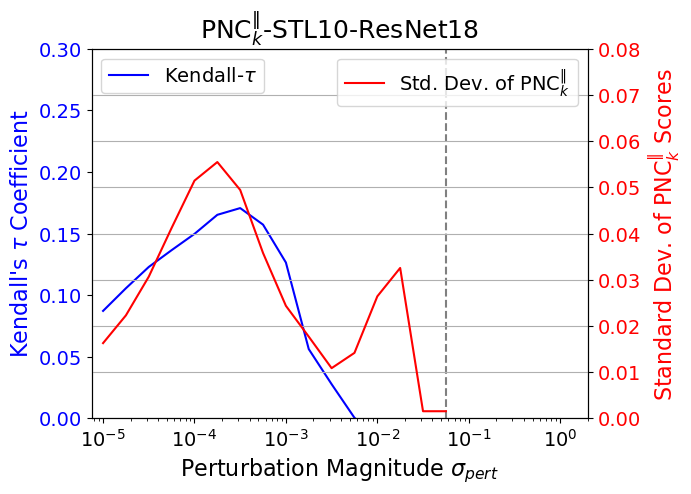

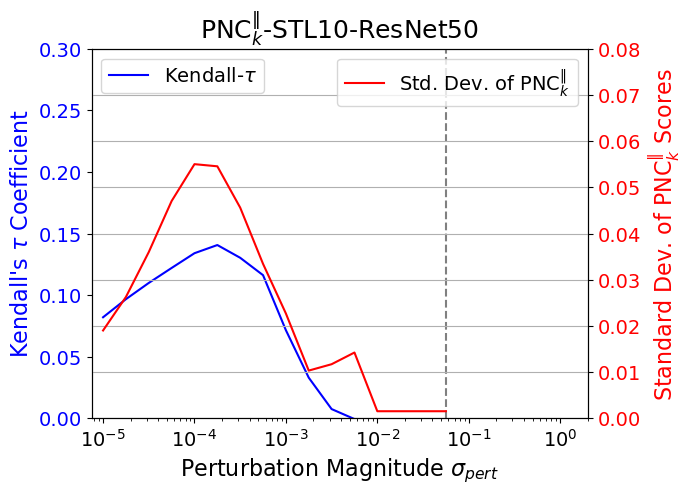

In [39]:
task = "multi"
perf = "brier"
ssl = "simclr"
pretrain = "imagenet32"
for method in ["gradinv", "ortho_space", "in_space"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.30], [0.0, 0.08], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_{method}_{task}_{perf}.jpg")

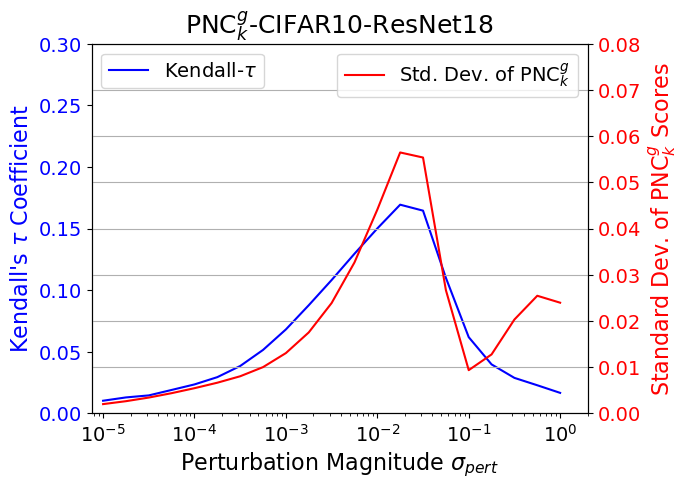

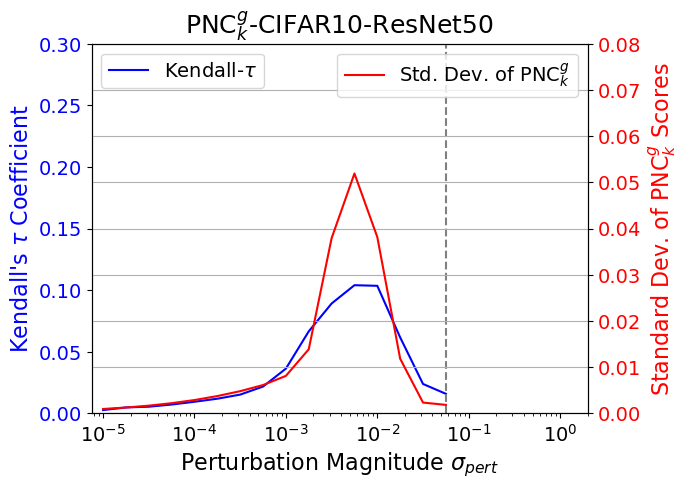

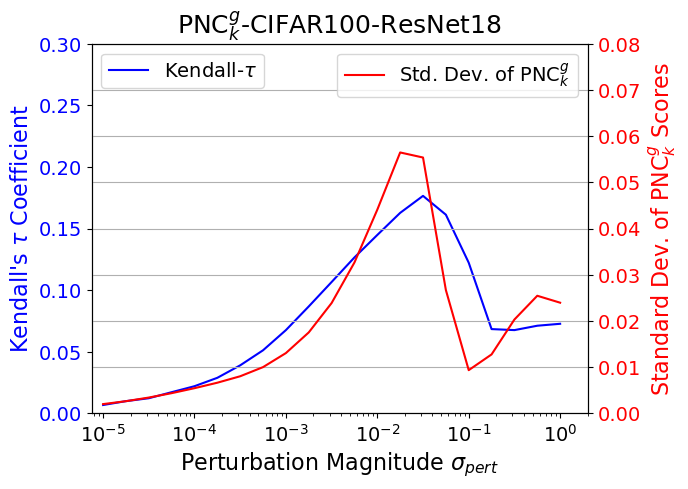

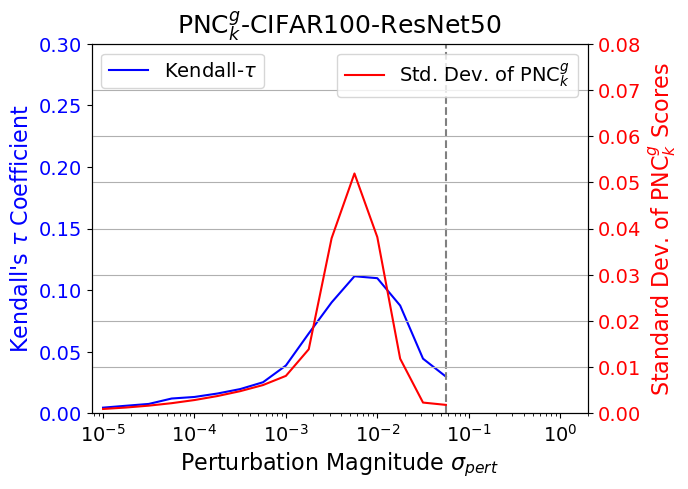

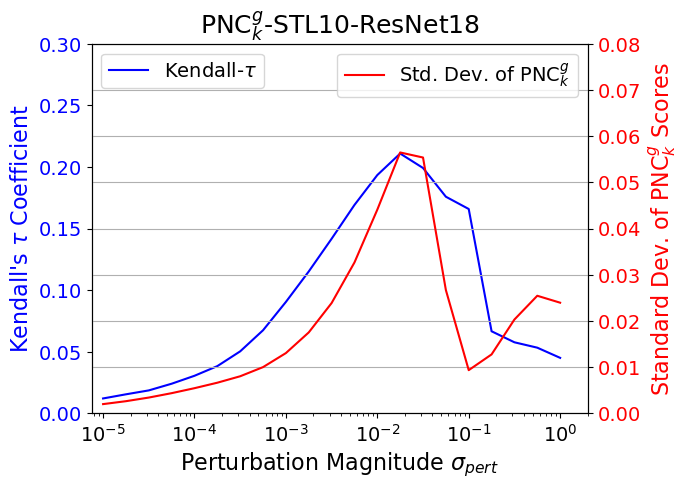

...

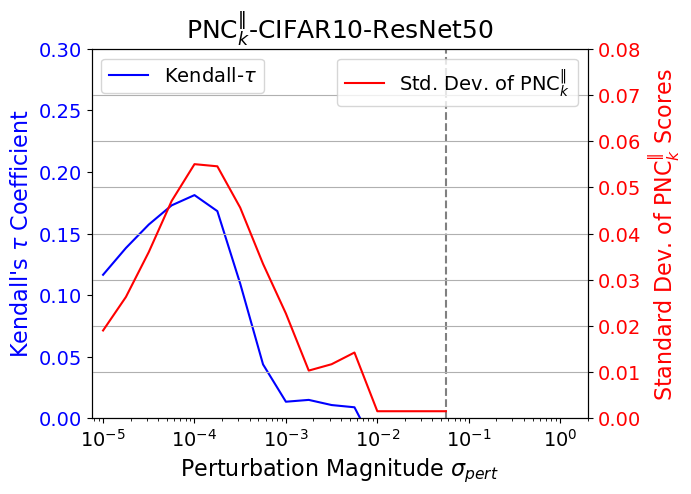

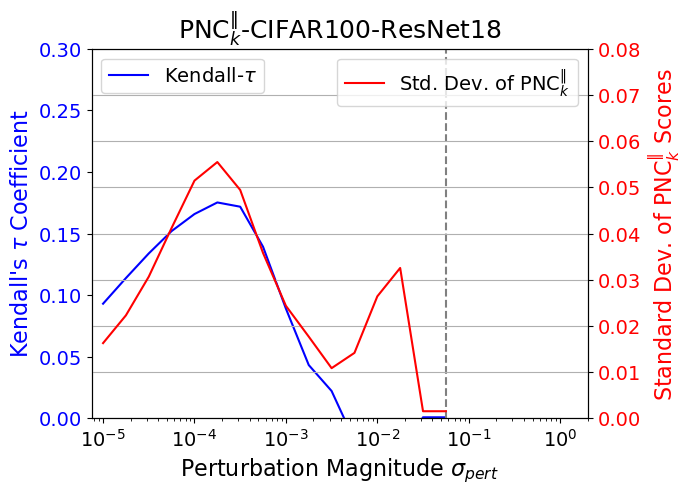

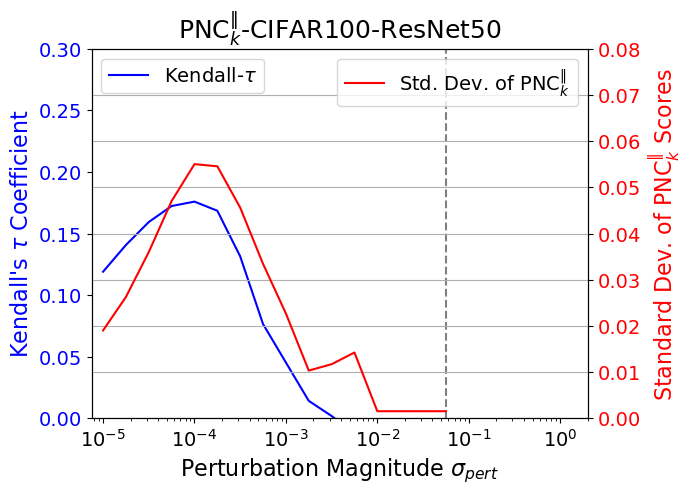

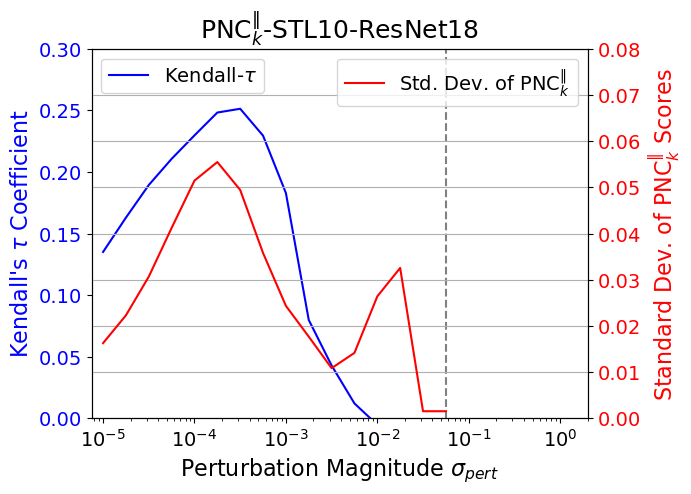

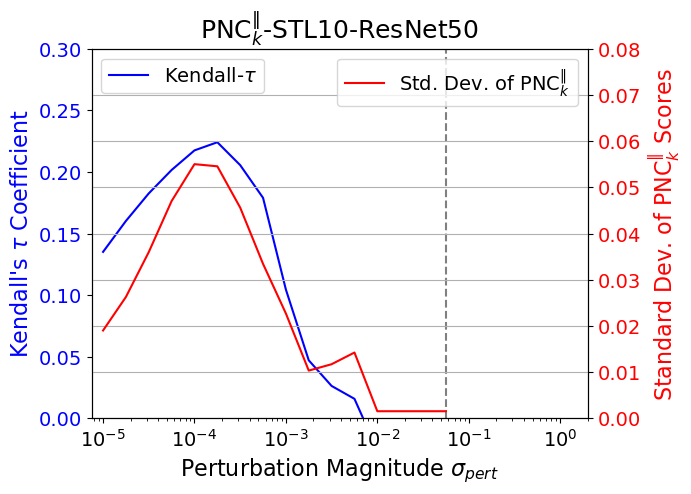

In [40]:
task = "multi"
perf = "pred_entropy"
ssl = "simclr"
pretrain = "imagenet32"
for method in ["gradinv", "ortho_space", "in_space"]:
    for downstream in ["cifar10", "cifar100", "stl10"]:
        for arch in ["resnet18", "resnet50"]:
            get_image(ssl, pretrain, arch, downstream, method, task, perf, f"{METHOD_TO_LATEX[method]}-{DATASET_TO_LATEX[downstream]}-{ARCH_TO_LATEX[arch]}", [0.0, 0.30], [0.0, 0.08], f"images/stddev_tuning_{ssl}_{pretrain}_{arch}_{downstream}_{method}_{task}_{perf}.jpg")